In [1]:
import json
import requests
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df = pd.read_excel('df.xlsx')

In [3]:
df[df['Walk Time to Metro (min)'].notna()]

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,...,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
82184,NaN,Смоленская,NaN,NaN,4.0,150.00,NaN,60.0,4.0,7.0,...,NaN,NaN,NaN,9 мин,3.0,Есть ремонт,NaN,"Школы, Магазины",Парковка,230000000.0
82185,NaN,Юго-Восточная,NaN,NaN,2.0,40.09,23.9,5.9,11.0,14.0,...,NaN,NaN,NaN,6 мин,2.5,NaN,NaN,Школы,Парковка,11400000.0
82186,NaN,Аэропорт,NaN,NaN,3.0,160.00,80.0,20.0,6.0,57.0,...,NaN,NaN,NaN,10 мин,3.2,NaN,NaN,"Школы, Магазины","Парковка, Видеонаблюдение",161772200.0
82187,NaN,Трикотажная,NaN,NaN,2.0,40.00,NaN,10.0,19.0,25.0,...,NaN,NaN,NaN,5 мин,3.0,Есть ремонт,NaN,NaN,Парковка,25000000.0
82188,NaN,Толстопальцево,NaN,NaN,NaN,26.17,16.2,5.0,5.0,19.0,...,NaN,NaN,NaN,4 мин,NaN,NaN,2017.0,NaN,Парковка,7800000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92250,NaN,Смоленская,NaN,NaN,4.0,200.00,131.0,60.0,10.0,19.0,...,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,NaN,242658300.0
92251,NaN,Парк Культуры,NaN,NaN,4.0,170.00,110.0,20.0,2.0,6.0,...,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Магазины,"Парковка, Видеонаблюдение",242658300.0
92252,NaN,Парк Культуры,NaN,NaN,4.0,167.00,110.0,25.0,2.0,6.0,...,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
92253,NaN,Смоленская,NaN,NaN,4.0,203.00,162.0,NaN,10.0,17.0,...,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


In [4]:
pd.set_option('display.max_columns', None)
df.sample(10)

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
58085,Москва,NaN,донецкая,30к2,2.0,35.7,21.0,12.0,29.0,32.0,NaN,2025-07-16T00:22:02+03:00,https://www.cian.ru/sale/flat/319790096/,NaN,0.0,55.646228,37.705841,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,13190000.0
75486,Москва,Митино,барышиха,38,3.0,72.0,NaN,12.0,9.0,14.0,NaN,2025-10-06T13:18:03+03:00,https://realty.ya.ru/offer/7847294201526732544/,"3-комнатная квартира: Москва, улица Барышиха, ...",0.0,55.851060,37.343506,0.0,realty.yandex.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,20000000.0
9446,Москва,Народное Ополчение,паршина,31к1,2.0,38.0,21.0,NaN,3.0,9.0,Кирпичный,2024-12-02T15:34:03+03:00,https://domclick.ru/card/sale__flat__2063054698,NaN,0.0,55.788150,37.455992,0.0,domclick.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12450000.0
4776,Москва,Дубровка,шарикоподшипниковская,40,2.0,56.3,NaN,9.0,4.0,10.0,кирпичный,2024-08-19T16:22:02+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 56,3 м², 4/10 эт.",0.0,55.713778,37.677149,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,25000000.0
4978,Москва,NaN,2й петра алексеева,5,2.0,60.0,NaN,12.0,3.0,29.0,Монолитный,2024-11-18T07:04:04+03:00,https://www.cian.ru/sale/flat/310055839,"2-к кв. Москва пер. 2-й Петра Алексеева, 5 (60...",0.0,55.717888,37.429627,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,35000000.0
34767,Москва,NaN,маршала савицкого,16,1.0,42.0,NaN,10.8,6.0,17.0,панельный,2025-03-28T02:50:25+03:00,https://www.avito.ru/moskva/kvartiry/1-k._kvar...,"1-к. квартира, 42 м², 6/17 эт.",0.0,55.504383,37.586777,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,8000000.0
90966,NaN,Авиамоторная,NaN,NaN,3.0,117.0,NaN,17.0,2.0,16.0,Монолитный,NaN,https://www.cian.ru/sale/flat/320583852/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15 мин,3.0,Дизайнерский ремонт,2019.0,Торговые центры,Парковка,67000000.0
81459,Москва,Академическая,шверника,122к2,3.0,80.4,39.0,13.0,3.0,5.0,блочный,2025-09-07T15:19:03+03:00,https://www.cian.ru/sale/flat/321591630/,NaN,0.0,55.690785,37.587901,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,25000000.0
32916,Москва,Белокаменная,наримановская,22к2,3.0,65.0,45.0,8.0,15.0,16.0,Панельный,2025-03-19T20:06:04+03:00,https://www.cian.ru/sale/flat/315165322,"3-к кв. Москва Наримановская ул., 22К2 (65.0 м²)",0.0,55.814224,37.706407,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17300000.0
6978,Москва,Белокаменная,лосиноостровская 3,Номер дома заполнен неверно,1.0,37.0,16.0,9.0,2.0,19.0,Монолитный,2024-05-26T13:56:04+03:00,https://www.avito.ru/moskva/kvartiry/1-k._kvar...,"1-к. квартира, 37 м², 2/19 эт.",0.0,55.849220,37.715470,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,10800000.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92255 entries, 0 to 92254
Data columns (total 29 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Region                    82184 non-null  object 
 1   Metro                     78015 non-null  object 
 2   Adress                    82133 non-null  object 
 3   House number              80958 non-null  object 
 4   Number of Rooms           89605 non-null  float64
 5   Square (m2)               92180 non-null  float64
 6   Living Square (m2)        68254 non-null  float64
 7   Kitchen Square (m2)       79256 non-null  float64
 8   Floor                     92175 non-null  float64
 9   Building Floors           92175 non-null  float64
 10  Building Material         71773 non-null  object 
 11  Created Date              82184 non-null  object 
 12  URL                       92255 non-null  object 
 13  Title                     55106 non-null  object 
 14  Land S

In [6]:
df.isnull().sum()

Region                      10071
Metro                       14240
Adress                      10122
House number                11297
Number of Rooms              2650
Square (m2)                    75
Living Square (m2)          24001
Kitchen Square (m2)         12999
Floor                          80
Building Floors                80
Building Material           20482
Created Date                10071
URL                             0
Title                       37149
Land Square (m2)            10071
LAT                         10072
LNG                         10072
Agent                       10071
Source                      10071
Type                        10071
Section                     10071
Category                    10071
Walk Time to Metro (min)    82259
Ceiling Height (m)          85500
Renovation                  87339
Year Built                  87536
Infrastructure              84495
Yard Improvement            83413
Price (rub)                   137
dtype: int64

In [7]:
df_saved = df

##Удалим часть пропусков

In [8]:
nan_str = df[df['Region'].isna() & df['Metro'].isna() & df['Square (m2)'].isna() & df['Price (rub)'].isna() & df['Adress'].isna() & df['House number'].isna()]
nan_str.isnull().sum()

Region                      75
Metro                       75
Adress                      75
House number                75
Number of Rooms             75
Square (m2)                 75
Living Square (m2)          75
Kitchen Square (m2)         75
Floor                       75
Building Floors             75
Building Material           75
Created Date                75
URL                          0
Title                       75
Land Square (m2)            75
LAT                         75
LNG                         75
Agent                       75
Source                      75
Type                        75
Section                     75
Category                    75
Walk Time to Metro (min)    75
Ceiling Height (m)          75
Renovation                  75
Year Built                  75
Infrastructure              75
Yard Improvement            75
Price (rub)                 75
dtype: int64

Удалим такие строки, т.к. нет целевой переменной и других параметров для дополнения

In [9]:
mask = df['Region'].isna() & df['Metro'].isna() & df['Square (m2)'].isna() & df['Price (rub)'].isna() & df['Adress'].isna() & df['House number'].isna()
df = df[~mask]

In [10]:
len(df)

92180

In [11]:
df.describe()

,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Land Square (m2),LAT,LNG,Agent,Ceiling Height (m),Year Built,Price (rub)
count,89605.000000,9.218000e+04,68254.000000,79256.000000,92175.000000,92175.000000,82184.0,82183.000000,82183.000000,82184.0,6755.000000,4719.000000,9.211800e+04
mean,1.895084,6.955888e+01,35.245157,11.014748,8.011272,15.490328,0.0,55.728042,37.575193,0.0,3.001709,2017.984954,2.973106e+07
std,0.928800,3.325551e+03,383.111042,7.027055,6.904237,9.499888,0.0,0.221653,0.199472,0.0,0.656530,8.977669,1.147917e+08
min,0.000000,0.000000e+00,0.300000,0.100000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,1.650000,1889.000000,0.000000e+00
25%,1.000000,3.600000e+01,19.300000,7.000000,3.000000,9.000000,0.0,55.653332,37.481738,0.0,2.700000,2016.000000,1.150000e+07
50%,2.000000,4.630000e+01,29.000000,9.500000,6.000000,14.000000,0.0,55.727780,37.576825,0.0,3.000000,2020.000000,1.550000e+07
75%,3.000000,6.400000e+01,40.000000,12.000000,11.000000,19.000000,0.0,55.808457,37.682096,0.0,3.100000,2023.000000,2.320000e+07
max,9.000000,1.000858e+06,98700.000000,500.000000,85.000000,117.000000,0.0,56.015009,37.974167,0.0,32.000000,2028.000000,9.815000e+09


##Удалим дубликаты

In [12]:
df = df.drop_duplicates()
df.shape

(92180, 29)

Явных дубликатов нет

In [13]:
print(f"Размер датасета до удаления: {len(df)}")
duplicates_count = df.duplicated(subset=['Adress', 'House number', 'Number of Rooms', 'Floor', 'Square (m2)']).sum()
print(f"Будет удалено {duplicates_count} дубликатов")
df = df.drop_duplicates(subset=['Adress', 'House number', 'Number of Rooms', 'Floor', 'Square (m2)'])
print(f"Размер датасета после удаления: {len(df)}")

Размер датасета до удаления: 92180
Будет удалено 21854 дубликатов
Размер датасета после удаления: 70326


In [14]:
duplicates = df.duplicated(subset=['Adress', 'House number', 'Number of Rooms', 'Floor', 'Square (m2)'], keep=False)

# Покажем все дублирующиеся строки
duplicated_rows = df[duplicates]
print(len(duplicated_rows))

0


In [15]:
df = df.reset_index(drop=True)
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.3,19.0,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,NaN,NaN,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,NaN,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.4,12.5,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.0,10.0,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.0,12.0,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70321,NaN,Деловой центр,NaN,NaN,NaN,176.2,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
70322,NaN,Арбатская,NaN,NaN,3.0,133.9,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
70323,NaN,Парк Культуры,NaN,NaN,4.0,167.0,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
70324,NaN,Смоленская,NaN,NaN,4.0,203.0,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


Удалили дубликаты по столбцам 'Adress', 'House number', 'Number of Rooms', 'Floor', 'Square (m2)'

In [16]:
df.isnull().sum()

Region                       7222
Metro                       11033
Adress                       7259
House number                 8373
Number of Rooms              1960
Square (m2)                     0
Living Square (m2)          18975
Kitchen Square (m2)         10215
Floor                           5
Building Floors                 5
Building Material           14651
Created Date                 7222
URL                             0
Title                       27639
Land Square (m2)             7222
LAT                          7222
LNG                          7222
Agent                        7222
Source                       7222
Type                         7222
Section                      7222
Category                     7222
Walk Time to Metro (min)    63104
Ceiling Height (m)          65461
Renovation                  66832
Year Built                  66707
Infrastructure              64710
Yard Improvement            63865
Price (rub)                    45
dtype: int64

In [17]:
df.shape

(70326, 29)

##Удалим пропуски

Удалим строки где отсутствуют значения в 'Region' и 'Metro'. заметим что во всех интересных нам столбцах (кроме price) - nan

In [18]:
nan_region_metro = df[df['Region'].isna() & df['Metro'].isna()]
nan_region_metro

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
63922,NaN,NaN,NaN,NaN,1.0,37.9,NaN,7.8,3.0,17.0,NaN,NaN,https://www.cian.ru/sale/flat/319500640/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,NaN,"Торговые центры, Школы",Парковка,10000000.0
63969,NaN,NaN,NaN,NaN,3.0,72.0,NaN,NaN,9.0,13.0,NaN,NaN,https://www.cian.ru/sale/flat/323348898/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20 мин,NaN,NaN,NaN,"Магазины, Школы",Парковка,24990000.0
64680,NaN,NaN,NaN,NaN,4.0,343.2,212.0,32.6,5.0,5.0,Монолитно-кирпичный,NaN,https://www.cian.ru/sale/flat/318388133/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,3.0,Дизайнерский ремонт,NaN,Школы,Парковка,62000000.0
65109,NaN,NaN,NaN,NaN,NaN,31.0,NaN,NaN,1.0,12.0,Панельный,NaN,https://www.cian.ru/sale/flat/322928364/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,NaN,"Школы, Магазины",NaN,9000000.0
65396,NaN,NaN,NaN,NaN,4.0,62.0,NaN,NaN,3.0,9.0,NaN,NaN,https://www.cian.ru/sale/flat/319856874/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12 мин,NaN,NaN,NaN,Школы,Парковка,13500000.0
65894,NaN,NaN,NaN,NaN,3.0,64.0,NaN,NaN,3.0,20.0,NaN,NaN,https://www.cian.ru/sale/flat/323078471/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,NaN,NaN,Парковка,38000000.0
67656,NaN,NaN,NaN,NaN,NaN,28.0,NaN,NaN,1.0,2.0,NaN,NaN,https://www.cian.ru/sale/flat/323382730/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,NaN,NaN,Парковка,7800000.0
68485,NaN,NaN,NaN,NaN,NaN,56.0,NaN,20.0,1.0,5.0,Панельный,NaN,https://www.cian.ru/sale/flat/323201527/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,2.5,NaN,NaN,Школы,Парковка,3540000.0
69528,NaN,NaN,NaN,NaN,NaN,31.0,NaN,NaN,3.0,4.0,NaN,NaN,https://www.cian.ru/sale/flat/322826240/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,2021.0,NaN,Парковка,6349000.0
69806,NaN,NaN,NaN,NaN,4.0,252.0,NaN,NaN,4.0,4.0,NaN,NaN,https://www.cian.ru/sale/flat/318556132/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,2021.0,Школы,Парковка,650000000.0


In [19]:
df = df[~(df['Region'].isna() & df['Metro'].isna())]
df.reset_index(drop=True)

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.3,19.0,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,NaN,NaN,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,NaN,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.4,12.5,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.0,10.0,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.0,12.0,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70311,NaN,Деловой центр,NaN,NaN,NaN,176.2,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
70312,NaN,Арбатская,NaN,NaN,3.0,133.9,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
70313,NaN,Парк Культуры,NaN,NaN,4.0,167.0,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
70314,NaN,Смоленская,NaN,NaN,4.0,203.0,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


In [20]:
dola_pattern = r'\bдол[яюеией]\b'
dola_count = len(df[df['Title'].str.contains(dola_pattern, case=False, na=False, regex=True)])
print(dola_count)
df = df[~df['Title'].str.contains(dola_pattern, case=False, na=False, regex=True)]
df.shape

361


(69955, 29)

In [21]:
nan_region = df[df['Region'].isna()]
nan_region

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
63104,NaN,Смоленская,NaN,NaN,4.0,150.00,NaN,60.0,4.0,7.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322345293/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,3.0,Есть ремонт,NaN,"Школы, Магазины",Парковка,230000000.0
63105,NaN,Юго-Восточная,NaN,NaN,2.0,40.09,23.9,5.9,11.0,14.0,Панельный,NaN,https://www.cian.ru/sale/flat/322596373/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,2.5,NaN,NaN,Школы,Парковка,11400000.0
63106,NaN,Аэропорт,NaN,NaN,3.0,160.00,80.0,20.0,6.0,57.0,Монолитно-кирпичный,NaN,https://www.cian.ru/sale/flat/303470941/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,3.2,NaN,NaN,"Школы, Магазины","Парковка, Видеонаблюдение",161772200.0
63107,NaN,Трикотажная,NaN,NaN,2.0,40.00,NaN,10.0,19.0,25.0,NaN,NaN,https://www.cian.ru/sale/flat/322722613/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5 мин,3.0,Есть ремонт,NaN,NaN,Парковка,25000000.0
63108,NaN,Толстопальцево,NaN,NaN,NaN,26.17,16.2,5.0,5.0,19.0,Панельный,NaN,https://www.cian.ru/sale/flat/320068864/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,NaN,NaN,2017.0,NaN,Парковка,7800000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70321,NaN,Деловой центр,NaN,NaN,NaN,176.20,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
70322,NaN,Арбатская,NaN,NaN,3.0,133.90,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
70323,NaN,Парк Культуры,NaN,NaN,4.0,167.00,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
70324,NaN,Смоленская,NaN,NaN,4.0,203.00,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


In [22]:
df['Region'] = df['Region'].fillna('Москва')

удалим строки с пропусками в adress, metro, house number

In [23]:
nan_adress_housenumber = df[df['Adress'].isna() & df['House number'].isna() & df['Metro'].isna()]
nan_adress_housenumber.shape

(24, 29)

In [24]:
df = df[~(df['Adress'].isna() & df['House number'].isna() & df['Metro'].isna())]
df.reset_index(drop=True)

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.3,19.0,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,NaN,NaN,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,NaN,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.4,12.5,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.0,10.0,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.0,12.0,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69926,Москва,Деловой центр,NaN,NaN,NaN,176.2,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
69927,Москва,Арбатская,NaN,NaN,3.0,133.9,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
69928,Москва,Парк Культуры,NaN,NaN,4.0,167.0,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
69929,Москва,Смоленская,NaN,NaN,4.0,203.0,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


Заполним пропуски в колонке metro модой по улице

In [25]:
nan_metro = df['Metro'].isna().sum()
print(nan_metro)
adress_metro_map = {}
for adress, group in df.groupby('Adress'):
    if not group['Metro'].isna().all():
        most_common_metro = group['Metro'].mode()
        if not most_common_metro.empty:
            adress_metro_map[adress] = most_common_metro[0]
def fill_metro_based_on_address(row):
    if pd.isna(row['Metro']) and pd.notna(row['Adress']):
        return adress_metro_map.get(row['Adress'], row['Metro'])
    return row['Metro']
df['Metro'] = df.apply(fill_metro_based_on_address, axis=1)
nan_metro_after = df['Metro'].isna().sum()
print(nan_metro_after)

10925
1645


In [26]:
df[df['Metro'].isna()]


,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
199,Москва,NaN,киевский,23а,1.0,28.0,20.0,4.0,12.0,16.0,кирпичный,2024-10-14T17:59:02+03:00,https://www.cian.ru/sale/flat/308258669/,NaN,0.0,55.430998,36.865036,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,6250000.0
343,Москва,NaN,10/12 / всеволода вишневского,1210,4.0,105.0,73.0,12.0,8.0,8.0,Кирпичный,2024-11-05T20:26:03+03:00,https://domclick.ru/card/sale__flat__2062474837,NaN,0.0,55.811766,37.568911,0.0,domclick.ru,Продам,Жилая недвижимость,4+ к квартира,NaN,NaN,NaN,NaN,NaN,NaN,30000000.0
375,Москва,NaN,к11,к11,2.0,45.6,32.5,8.2,4.0,4.0,Монолит,2024-03-30T09:57:04+03:00,//youla.ru/all/nedvijimost/prodaja-kvartiri/kv...,"Квартира, 2 комнаты, 45.6 м²",0.0,55.934932,37.176225,0.0,youla.io,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,5000000.0
452,Москва,NaN,2я пятилетка,4,1.0,30.7,18.0,6.0,4.0,5.0,кирпичный,2024-11-06T00:57:02+03:00,https://www.avito.ru/moskva_zelenograd/kvartir...,"1-к. квартира, 30,7 м², 4/5 эт.",0.0,55.976765,37.171307,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,11499000.0
495,Москва,NaN,скандинавия жилой комплекс,к3612,3.0,62.4,37.0,7.6,14.0,16.0,NaN,2024-11-02T00:05:03+03:00,https://www.cian.ru/sale/flat/309040101,"3-к кв. Москва Сосенское поселение, Скандинави...",0.0,55.556814,37.501938,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,16000000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63024,Москва,NaN,светлый кп,60,3.0,135.0,NaN,22.0,1.0,4.0,блочный,2022-08-21T11:04:05+03:00,https://www.cian.ru/sale/flat/277339825/,NaN,0.0,55.507718,37.265846,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,20000000.0
63040,Москва,NaN,18й мн,к1815,1.0,38.5,18.5,8.5,2.0,14.0,Блочный,2025-11-04T19:10:02+03:00,https://domclick.ru/card/sale__flat__2071287396,NaN,0.0,55.982155,37.163345,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,8200000.0
63066,Москва,NaN,коммунарка александры монаховой,43к2,3.0,85.0,48.0,20.0,12.0,18.0,NaN,2025-04-24T12:32:02+03:00,https://kommunarka.sob.ru/prodazha-kvartir-3-k...,Продается 3-комнатная квартира,0.0,55.563208,37.487523,0.0,sob.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,20000000.0
63073,Москва,NaN,михалковский 3й,14к1,1.0,35.0,6.0,21.0,2.0,5.0,NaN,2025-09-18T09:04:03+03:00,https://sob.ru/prodazha-kvartir-moskva-1-komn-...,Продается 1-комнатная квартира,0.0,55.836044,37.528549,0.0,sob.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12000000.0


Удалим строки которые не заполнились

In [27]:
df.shape

(69931, 29)

In [28]:
df = df[df['Metro'].notna()]
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.3,19.0,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,NaN,NaN,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,NaN,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.4,12.5,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.0,10.0,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.0,12.0,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70321,Москва,Деловой центр,NaN,NaN,NaN,176.2,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
70322,Москва,Арбатская,NaN,NaN,3.0,133.9,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
70323,Москва,Парк Культуры,NaN,NaN,4.0,167.0,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
70324,Москва,Смоленская,NaN,NaN,4.0,203.0,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


In [29]:
df[df['Adress'].isna()]

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
1044,Москва,Бутырская,NaN,NaN,1.0,42.3,NaN,NaN,29.0,55.0,Монолитный,2024-11-07T17:03:05+03:00,https://www.cian.ru/sale/flat/309630183,1-к кв. Москва (42.3 м²),0.0,55.811837,37.608455,0.0,cian.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,18800000.0
1477,Москва,Охотный Ряд,NaN,NaN,1.0,0.0,NaN,NaN,0.0,0.0,NaN,2024-10-20T02:58:01+03:00,https://www.avito.ru/moskva/kvartiry/kuplyu_1-...,Куплю 1-к. квартиру,0.0,55.755864,37.617698,0.0,avito.ru,Куплю,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12345678.0
4422,Москва,Студенческая,NaN,NaN,2.0,77.6,29.3,25.2,10.0,11.0,Монолитный,2024-11-14T16:05:06+03:00,https://www.cian.ru/sale/flat/309933395,2-к кв. Москва (77.6 м²),0.0,55.748997,37.555262,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,114900000.0
6179,Москва,Красносельская,NaN,NaN,1.0,21.0,15.0,3.7,2.0,10.0,NaN,2024-11-24T20:05:03+03:00,https://www.cian.ru/sale/flat/310382397,Студия Москва (21.0 м²),0.0,55.782121,37.666963,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,14500000.0
9065,Москва,Марьина роща,NaN,98,1.0,24.8,NaN,NaN,3.0,25.0,монолитный,2023-05-05T11:08:13+03:00,https://www.avito.ru/moskva/kvartiry/apartamen...,"Апартаменты-студия, 24,8 м², 3/25 эт.",0.0,55.799890,37.615110,0.0,avito.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,10580000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70321,Москва,Деловой центр,NaN,NaN,NaN,176.2,126.2,30.0,40.0,59.0,Монолитный,NaN,https://www.cian.ru/sale/flat/302277595/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 мин,3.5,NaN,2011.0,"Магазины, Торговые центры",Парковка,242900000.0
70322,Москва,Арбатская,NaN,NaN,3.0,133.9,NaN,30.0,2.0,5.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/292266687/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9 мин,NaN,Дизайнерский ремонт,NaN,NaN,Парковка,150000000.0
70323,Москва,Парк Культуры,NaN,NaN,4.0,167.0,110.0,25.0,2.0,6.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322234429/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2001.0,Школы,Парковка,242658300.0
70324,Москва,Смоленская,NaN,NaN,4.0,203.0,162.0,NaN,10.0,17.0,Монолитный,NaN,https://www.cian.ru/sale/flat/285546652/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,NaN,NaN,"Парковка, Видеонаблюдение",242658300.0


In [30]:
df.isna().sum()

Region                          0
Metro                           0
Adress                       7225
House number                 8177
Number of Rooms              1956
Square (m2)                     0
Living Square (m2)          18439
Kitchen Square (m2)          9850
Floor                           5
Building Floors                 5
Building Material           14220
Created Date                 7212
URL                             0
Title                       26866
Land Square (m2)             7212
LAT                          7212
LNG                          7212
Agent                        7212
Source                       7212
Type                         7212
Section                      7212
Category                     7212
Walk Time to Metro (min)    61074
Ceiling Height (m)          63423
Renovation                  64793
Year Built                  64669
Infrastructure              62677
Yard Improvement            61834
Price (rub)                    45
dtype: int64

Заполним пропуски в house number 'Не указан'

In [31]:
df['House number'] = df['House number'].fillna('Не указан')


##Распределение площади
Заметим что есть явные аномалии и выбросы

Text(0.5, 1.0, 'Boxplot Square (m2)')

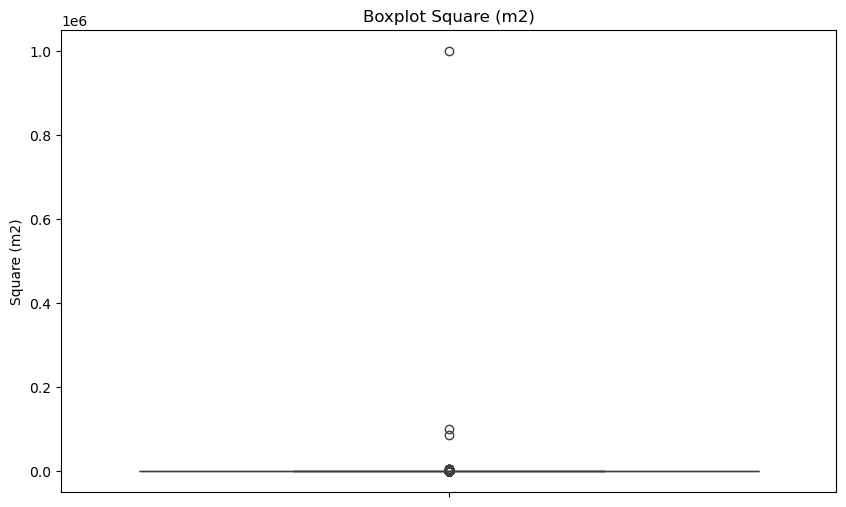

In [32]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['Square (m2)'])
plt.title('Boxplot Square (m2)')

In [33]:
largest_squares = df.nlargest(10, 'Square (m2)')
largest_squares

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
61243,Москва,Царицыно,педагогическая,4,3.0,1000858.0,15152.0,500.0,2.0,12.0,NaN,2025-10-26T09:03:02+03:00,https://realty.ya.ru/offer/8334424868849348865/,"3-комнатная квартира: Москва, Педагогическая у...",0.0,55.595078,37.665775,0.0,realty.yandex.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,161632560.0
12017,Москва,Спартак,клубный город на реке примавера жилой комплекс,Не указан,0.0,100000.0,98700.0,35.0,12.0,22.0,NaN,2024-12-19T01:03:04+03:00,https://www.cian.ru/sale/flat/311457916,"Свободной планировки кв. Москва Россини кв-л, ...",0.0,55.814411,37.421335,0.0,cian.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,58000000.0
33892,Москва,Мичуринский проспект,левел мичуринский жилой комплекс,к2,4.0,86701.0,55.0,13.0,2.0,54.0,Монолитный,2025-04-28T12:17:02+03:00,https://www.cian.ru/sale/flat/316875011,4-к кв. Москва Левел Мичуринский жилой комплек...,0.0,55.688119,37.472697,0.0,cian.ru,Продам,Жилая недвижимость,4+ к квартира,NaN,NaN,NaN,NaN,NaN,NaN,34000000.0
32750,Москва,Мичуринский проспект,удальцова,89к3,3.0,5000.0,74.0,13.6,5.0,16.0,Панельный,2025-04-21T20:21:04+03:00,https://www.avito.ru/moskva/kvartiry/3-k._kvar...,"3-к. квартира, 5000 м², 5/16 эт.",0.0,55.686151,37.483576,0.0,avito.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,23000000.0
50664,Москва,Марьино,батюнинская,10,2.0,5000.0,49.0,12.0,3.0,5.0,кирпичный,2025-08-17T20:11:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 5000 м², 3/5 эт.",0.0,55.658844,37.703407,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,11800000.0
15296,Москва,Коптево,михалковская,15,2.0,4692.0,46.2,5.2,6.0,9.0,Кирпичный,2025-01-16T01:16:03+03:00,https://www.cian.ru/sale/flat/312386434,"2-к кв. Москва Михалковская ул., 15 (4692.0 м²)",0.0,55.839537,37.526304,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,11000000.0
52801,Москва,Перово,3я владимирская,3к2,2.0,4400.0,42.0,6.8,3.0,5.0,панельный,2025-09-01T16:37:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 4400 м², 3/5 эт.",0.0,55.763226,37.786617,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,11500000.0
52067,Москва,Петровский парк,ленинградский,377,2.0,4000.0,40.1,12.0,10.0,42.0,монолитно-кирпичный,2025-08-27T20:59:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 4000 м², 10/42 эт.",0.0,55.793697,37.543190,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,38000000.0
26606,Москва,Люблино,совхозная,10б,1.0,3991.0,17.0,12.0,5.0,24.0,Монолитный,2025-03-18T08:04:04+03:00,https://www.cian.ru/sale/flat/315071806,"1-к кв. Москва Совхозная ул., 10Б (3991.0 м²)",0.0,55.674412,37.762623,0.0,cian.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,18700000.0
54405,Москва,Шаболовская,шаболовка,25к2,2.0,3700.0,43.3,3.4,4.0,5.0,Кирпичный,2025-09-09T17:17:14+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 3700 м², 4/5 эт.",0.0,55.722370,37.611023,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,21500000.0


In [34]:
Q1 = df['Square (m2)'].quantile(0.25)
Q3 = df['Square (m2)'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(int(lower_bound), int(upper_bound))
anomalies = df[(df['Square (m2)'] < lower_bound) | (df['Square (m2)'] > upper_bound)]
normal_data = df[(df['Square (m2)'] >= lower_bound) & (df['Square (m2)'] <= upper_bound)]
print(len(anomalies))
print(len(normal_data))


-6 107
3839
64447


слишком много аномалий, тк upper bound низкий. попробуем повысить

In [35]:
large_areas = df[df['Square (m2)'] > 102]

print(len(large_areas))
print(len(df[df['Square (m2)'] > 150]))
print(len(df[df['Square (m2)'] > 200]))

4327
1870
1111


оставим квартиры до 200м2

In [36]:
df.shape

(68286, 29)

In [37]:
df = df[df['Square (m2)'] <= 180]
df = df[df['Price (rub)'] <= 180000000]
df.shape

(66513, 29)

Text(0.5, 1.0, 'Boxplot Square (m2)')

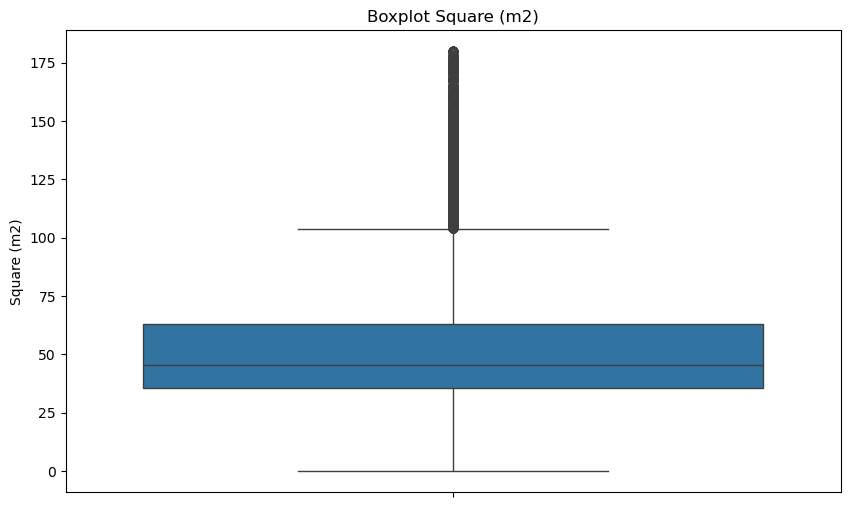

In [38]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['Square (m2)'])
plt.title('Boxplot Square (m2)')

In [39]:
df.reset_index(drop=True)

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.3,19.0,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,NaN,NaN,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,NaN,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.4,12.5,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.0,10.0,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.0,12.0,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66508,Москва,Беломорская,NaN,Не указан,3.0,103.0,56.0,9.0,8.0,24.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.1,NaN,2016.0,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.0
66509,Москва,Тверская,NaN,Не указан,4.0,115.0,100.0,7.0,4.0,7.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.2,NaN,NaN,Магазины,Парковка,178000000.0
66510,Москва,Арбатская,NaN,Не указан,2.0,69.7,45.0,15.0,4.0,7.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.0,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.0
66511,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.0,100.0,40.0,27.0,28.0,NaN,NaN,https://www.cian.ru/sale/flat/319585927/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.0,"Школы, Магазины",Парковка,116000000.0


In [40]:
df.isna().sum()

Region                          0
Metro                           0
Adress                       5988
House number                    0
Number of Rooms              1256
Square (m2)                     0
Living Square (m2)          17651
Kitchen Square (m2)          9606
Floor                           4
Building Floors                 4
Building Material           13739
Created Date                 5975
URL                             0
Title                       25445
Land Square (m2)             5975
LAT                          5975
LNG                          5975
Agent                        5975
Source                       5975
Type                         5975
Section                      5975
Category                     5975
Walk Time to Metro (min)    60538
Ceiling Height (m)          62465
Renovation                  63339
Year Built                  63748
Infrastructure              61681
Yard Improvement            61249
Price (rub)                     0
dtype: int64

##Пропуски в площади кухни и жилой
Судя по рассчетам жилая площадь занимает примерно 60% от всей площади. Заполним пропуски в колонке жилая площадь

In [41]:
filled_mask = df['Living Square (m2)'].notna()
living_ratios = df[filled_mask]['Living Square (m2)'] / df[filled_mask]['Square (m2)']
ratio_median = living_ratios.median()
print(round(ratio_median, 2))

0.59


In [42]:
df['Living Square (m2)'] = df['Living Square (m2)'].fillna(df['Square (m2)'] * 0.6)

Коэффициент площади кухни равен примерно 19%

In [43]:
mask_kitchen = df['Kitchen Square (m2)'].notna()
kitchen_ratio = df[mask_kitchen]['Kitchen Square (m2)'] / df[mask_kitchen]['Square (m2)']
ratio_median_k = kitchen_ratio.median()
print(round(ratio_median_k, 2))

0.19


In [44]:
df['Kitchen Square (m2)'] = df['Kitchen Square (m2)'].fillna(df['Square (m2)'] * 0.19)

In [45]:
df.isna().sum()

Region                          0
Metro                           0
Adress                       5988
House number                    0
Number of Rooms              1256
Square (m2)                     0
Living Square (m2)              0
Kitchen Square (m2)             0
Floor                           4
Building Floors                 4
Building Material           13739
Created Date                 5975
URL                             0
Title                       25445
Land Square (m2)             5975
LAT                          5975
LNG                          5975
Agent                        5975
Source                       5975
Type                         5975
Section                      5975
Category                     5975
Walk Time to Metro (min)    60538
Ceiling Height (m)          62465
Renovation                  63339
Year Built                  63748
Infrastructure              61681
Yard Improvement            61249
Price (rub)                     0
dtype: int64

Завполним колонку материал модой по улице.

In [46]:
df[df['Building Material'].isna()].shape

(13739, 29)

Остальные заполним модой по всекм значениям

In [47]:
most_common_material = df['Building Material'].mode()[0]
df['Building Material'] = df['Building Material'].fillna(most_common_material)

заполним Title значением 'не указано'

In [48]:
df['Title'] = df['Title'].fillna('Не указано')

In [49]:
df.isna().sum()

Region                          0
Metro                           0
Adress                       5988
House number                    0
Number of Rooms              1256
Square (m2)                     0
Living Square (m2)              0
Kitchen Square (m2)             0
Floor                           4
Building Floors                 4
Building Material               0
Created Date                 5975
URL                             0
Title                           0
Land Square (m2)             5975
LAT                          5975
LNG                          5975
Agent                        5975
Source                       5975
Type                         5975
Section                      5975
Category                     5975
Walk Time to Metro (min)    60538
Ceiling Height (m)          62465
Renovation                  63339
Year Built                  63748
Infrastructure              61681
Yard Improvement            61249
Price (rub)                     0
dtype: int64

Колонки Walk Time to Metro (min), Ceiling Height (m), Renovation, Year Built, Infrastructure, Yard Improvement пустые во всем датасете. Удалим их

In [50]:
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.30,19.00,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,22.80,7.22,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.40,12.50,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.00,10.00,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.00,12.00,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69698,Москва,Беломорская,NaN,Не указан,3.0,103.0,56.00,9.00,8.0,24.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.1,NaN,2016.0,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.0
70315,Москва,Тверская,NaN,Не указан,4.0,115.0,100.00,7.00,4.0,7.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.2,NaN,NaN,Магазины,Парковка,178000000.0
70317,Москва,Арбатская,NaN,Не указан,2.0,69.7,45.00,15.00,4.0,7.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.0,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.0
70319,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.0,100.00,40.00,27.0,28.0,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.0,"Школы, Магазины",Парковка,116000000.0


In [51]:
df.describe()

,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Land Square (m2),LAT,LNG,Agent,Ceiling Height (m),Year Built,Price (rub)
count,65257.000000,66513.000000,66513.000000,66513.000000,66509.000000,66509.000000,60538.0,60538.000000,60538.000000,60538.0,4048.000000,2765.000000,6.651300e+04
mean,1.868903,51.324715,30.638619,10.037177,8.162249,15.812492,0.0,55.728716,37.579811,0.0,2.925425,2019.747920,2.029253e+07
std,0.903756,24.687692,16.506929,5.828618,6.869101,9.541756,0.0,0.103537,0.144247,0.0,0.682972,5.266326,1.737562e+07
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,55.212283,36.920579,0.0,1.650000,1958.000000,0.000000e+00
25%,1.000000,35.800000,19.000000,6.000000,3.000000,9.000000,0.0,55.654574,37.483582,0.0,2.700000,2018.000000,1.150000e+07
50%,2.000000,45.700000,28.000000,9.000000,6.000000,14.000000,0.0,55.727823,37.579421,0.0,2.850000,2021.000000,1.550000e+07
75%,2.000000,63.000000,39.000000,12.000000,11.000000,20.000000,0.0,55.807198,37.683060,0.0,3.000000,2023.000000,2.300000e+07
max,9.000000,180.000000,386.000000,120.000000,82.000000,117.000000,0.0,56.011032,37.974167,0.0,32.000000,2026.000000,1.800000e+08


##Добавим столбик цена квадратного метра

In [52]:
df['Стоимость м² (руб)'] = (df['Price (rub)'] / df['Square (m2)']).round(2)

Удалим объявления типа "Куплю"

In [53]:
df = df[df['Type'] != 'Куплю']

##Поработаем с выбросами и аномалиями

Удалим объявления которые продают комнату.

In [54]:
cat_room = df[df['Category'] == 'Комната']
cat_room

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
13,Москва,Зябликово,ясеневая,39к1,1.0,11.6,6.96,2.204,10.0,12.0,панельный,2024-08-07T00:16:02+03:00,https://www.avito.ru/moskva/komnaty/komnata_11...,"Комната 11,6 м² в 2-к., 10/12 эт.",0.0,55.606497,37.741129,0.0,avito.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,3525000.0,303879.31
52,Москва,Физтех,9я северная,13,1.0,17.0,17.00,10.000,1.0,12.0,Панельный,2024-11-05T08:30:06+03:00,https://domclick.ru/card/sale__room__2062456629,Не указано,0.0,55.934321,37.548977,0.0,domclick.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,4890000.0,287647.06
53,Москва,Косино,большая косинская,16к2,1.0,9.6,5.76,1.824,10.0,12.0,панельный,2024-03-10T19:23:02+03:00,https://www.avito.ru/moskva/komnaty/komnata_96...,"Комната 9,6 м² в 3-к., 10/12 эт.",0.0,55.710575,37.855285,0.0,avito.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,2900000.0,302083.33
113,Москва,Проспект Мира,орловодавыдовский,25к2,1.0,17.2,10.32,3.268,4.0,5.0,кирпичный,2024-11-05T11:13:02+03:00,https://www.avito.ru/moskva/komnaty/komnata_17...,"Комната 17,2 м² в 3-к., 4/5 эт.",0.0,55.782162,37.639460,0.0,avito.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,7400000.0,430232.56
119,Москва,Лефортово,красноказарменная,12к1,1.0,20.2,12.12,3.838,3.0,4.0,кирпичный,2024-05-10T01:22:05+03:00,https://www.avito.ru/moskva/komnaty/komnata_20...,"Комната 20,2 м² в 5-к., 3/4 эт.",0.0,55.756863,37.699217,0.0,avito.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,5230000.0,258910.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62958,Москва,Пролетарская,малая калитниковская,2к1,1.0,15.5,43.10,7.100,11.0,12.0,панельный,2025-10-22T00:24:02+03:00,https://www.cian.ru/sale/flat/323139760/,Не указано,0.0,55.735033,37.680311,0.0,cian.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,6168000.0,397935.48
62967,Москва,Перово,перова поля 3й,7,1.0,98.0,58.80,18.620,5.0,5.0,Панельный,2025-08-28T19:51:03+03:00,https://sob.ru/prodazha-komnat-moskva-4-komn-m...,Продается комната в 4-комнатной квартире,0.0,55.750651,37.774822,0.0,sob.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,10700000.0,109183.67
63048,Москва,Царицыно,бирюлевская,5к1,1.0,11.8,7.08,2.242,9.0,9.0,Панельный,2025-01-19T20:08:03+03:00,https://www.cian.ru/sale/flat/312539127,"Комната Москва Бирюлевская ул., 5К1 (11.8 м²)",0.0,55.599672,37.664599,0.0,cian.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,3650000.0,309322.03
63068,Москва,Зябликово,ясеневая,33к1,1.0,15.0,9.00,14.000,10.0,14.0,панельный,2025-11-05T20:48:02+03:00,https://www.cian.ru/sale/flat/323622270/,Не указано,0.0,55.605485,37.739447,0.0,cian.ru,Продам,Жилая недвижимость,Комната,NaN,NaN,NaN,NaN,NaN,NaN,5300000.0,353333.33


In [55]:
unique_categories = df['Category'].nunique()
categories_list = df['Category'].unique()
print(categories_list)
category_counts = df['Category'].value_counts()
print(category_counts)

['2-к квартира' '1-к квартира' '3-к квартира' 'Студия' 'Комната'
 '4+ к квартира' nan]
Category
2-к квартира     19951
1-к квартира     17033
3-к квартира     11890
Студия            6557
Комната           2701
4+ к квартира     2289
Name: count, dtype: int64


In [56]:
df = df[df['Category'] != 'Комната']
df = df.reset_index(drop=True)

In [57]:
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.30,19.00,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,22.80,7.22,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0,403947.37
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.40,12.50,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.00,10.00,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.00,12.00,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63690,Москва,Беломорская,NaN,Не указан,3.0,103.0,56.00,9.00,8.0,24.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.1,NaN,2016.0,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.0,347087.38
63691,Москва,Тверская,NaN,Не указан,4.0,115.0,100.00,7.00,4.0,7.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.2,NaN,NaN,Магазины,Парковка,178000000.0,1547826.09
63692,Москва,Арбатская,NaN,Не указан,2.0,69.7,45.00,15.00,4.0,7.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.0,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.0,1276345.16
63693,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.0,100.00,40.00,27.0,28.0,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.0,"Школы, Магазины",Парковка,116000000.0,674418.60


In [58]:
square_10m = df[(df['Square (m2)'] > 5) & (df['Square (m2)'] < 10)]
square_10m

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
9544,Москва,Сокол,2й амбулаторный,8с3,1.0,9.2,5.52,1.748,1.0,5.0,Панельный,2024-12-10T10:03:04+03:00,https://www.cian.ru/sale/flat/311074131,"Студия Москва 2-й Амбулаторный проезд, 8С3 (9....",0.0,55.812595,37.531379,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,4550000.0,494565.22
13814,Москва,Бутырская,огородный,5с6,1.0,7.0,4.20,1.330,5.0,5.0,Панельный,2025-01-16T12:02:15+03:00,https://domclick.ru/card/sale__flat__2063815562,Не указано,0.0,55.809540,37.605975,0.0,domclick.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,1600000.0,228571.43
14833,Москва,Улица Горчакова,адмирала руднева,4,5.0,8.4,5.04,1.596,1.0,2.0,Панельный,2025-01-20T15:14:03+03:00,https://www.cian.ru/sale/flat/312571686,"5-к кв. Москва ул. Адмирала Руднева, 4 (8.4 м²)",0.0,55.543868,37.526061,0.0,cian.ru,Продам,Жилая недвижимость,4+ к квартира,NaN,NaN,NaN,NaN,NaN,NaN,330000.0,39285.71
15970,Москва,Улица Горчакова,адмирала руднева,4,1.0,8.4,5.04,1.596,1.0,2.0,Панельный,2025-01-27T18:13:03+03:00,https://www.cian.ru/sale/flat/312887055,"1-к кв. Москва ул. Адмирала Руднева, 4 (8.4 м²)",0.0,55.543868,37.526061,0.0,cian.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,330000.0,39285.71
26912,Москва,Выхино,сормовская,4,1.0,9.5,5.70,1.805,1.0,9.0,Панельный,2025-04-02T23:57:02+03:00,https://domclick.ru/card/sale__flat__2065689201,Не указано,0.0,55.711782,37.812615,0.0,domclick.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,3950000.0,415789.47
30283,Москва,Маяковская,1й тверскойяой,14,1.0,9.5,7.50,2.000,1.0,7.0,Кирпичный,2025-04-24T23:30:03+03:00,https://domclick.ru/card/sale__flat__2066265748,Не указано,0.0,55.772897,37.598225,0.0,domclick.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,7100000.0,747368.42
32481,Москва,Выхино,сормовская,4,1.0,9.0,5.40,1.710,1.0,9.0,Панельный,2025-05-11T00:47:04+03:00,https://domclick.ru/card/sale__flat__2066599430,Не указано,0.0,55.711782,37.812615,0.0,domclick.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,3950000.0,438888.89
33915,Москва,Сходненская,нелидовская,25к1,1.0,9.0,5.00,2.000,1.0,12.0,панельный,2025-05-20T10:32:02+03:00,https://www.cian.ru/sale/flat/317747642/,Не указано,0.0,55.845658,37.433858,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,4450000.0,494444.44
42276,Москва,Селигерская,дегунинская,1к3,1.0,9.5,9.00,0.500,4.0,9.0,Панельный,2025-07-19T23:55:03+03:00,https://www.cian.ru/sale/flat/319923241/,Не указано,0.0,55.863520,37.539464,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,4800000.0,505263.16
43832,Москва,Бауманская,центросоюзный,13с2,1.0,9.7,5.82,1.843,4.0,4.0,Кирпичный,2025-07-31T12:31:03+03:00,https://domclick.ru/card/sale__flat__2068819541,Не указано,0.0,55.779984,37.685294,0.0,domclick.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,4700000.0,484536.08


In [59]:
square5 = df[(df['Square (m2)'] < 10)]
square5

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
4619,Москва,Бауманская,денисовский,13,1.0,3.0,1.80,0.570,1.0,5.0,Панельный,2024-11-21T01:04:04+03:00,https://www.cian.ru/sale/flat/310243022,"Студия Москва Денисовский пер., 13 (3.0 м²)",0.0,55.766557,37.673996,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,690000.0,230000.00
5859,Москва,Авиамоторная,красноказарменная,14ак1,2.0,2.0,33.80,20.900,23.0,23.0,Монолитный,2024-09-26T15:23:03+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 2-к. квартира, 70,1 м², 23/23 эт.",0.0,55.753368,37.705875,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,32600000.0,16300000.00
5904,Москва,Университет,ленинский,85,1.0,1.0,14.00,2.000,1.0,10.0,Кирпичный,2024-10-26T00:59:02+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 1-к. квартира, 16 м², 1/10 эт.",0.0,55.680832,37.535870,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,6490000.0,6490000.00
6799,Москва,Боровицкая,кремлёвская,19с9,4.0,4.0,2.40,15.000,3.0,4.0,Кирпичный,2024-09-24T13:49:02+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 4-к. квартира, 109,9 м², 3/4 эт.",0.0,55.748025,37.610420,0.0,avito.ru,Продам,Жилая недвижимость,4+ к квартира,NaN,NaN,NaN,NaN,NaN,NaN,45900000.0,11475000.00
7765,Москва,Пражская,харьковский,11к2,1.0,1.0,0.60,6.700,8.0,12.0,Панельный,2024-11-02T15:53:03+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 1-к. квартира, 33 м², 8/12 эт.",0.0,55.588806,37.639465,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,8100000.0,8100000.00
8127,Москва,Марксистская,большая андроньевская,20,1.0,1.0,19.10,9.500,1.0,12.0,Панельный,2024-10-04T17:32:09+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 1-к. квартира, 34,8 м², 1/12 эт.",0.0,55.742012,37.670197,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,13700000.0,13700000.00
9067,Москва,Солнцево,волынская,4,1.0,1.0,20.80,8.600,10.0,14.0,Панельный,2022-04-30T09:53:05+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 1-к. квартира, 39,2 м², 10/14 эт.",0.0,55.645426,37.413790,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12500000.0,12500000.00
9544,Москва,Сокол,2й амбулаторный,8с3,1.0,9.2,5.52,1.748,1.0,5.0,Панельный,2024-12-10T10:03:04+03:00,https://www.cian.ru/sale/flat/311074131,"Студия Москва 2-й Амбулаторный проезд, 8С3 (9....",0.0,55.812595,37.531379,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,4550000.0,494565.22
11438,Москва,Октябрьское поле,берзарина,28ак3,3.0,3.0,50.00,12.000,3.0,24.0,Монолитный,2024-12-26T15:29:03+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 3-к. квартира, 88 м², 3/24 эт.",0.0,55.790047,37.475533,0.0,avito.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40000000.0,13333333.33
12478,Москва,Шелепиха,шмитовский,39,2.0,2.0,1.20,29.100,5.0,53.0,Монолитный,2025-01-08T16:58:03+03:00,https://www.avito.ru/moskva/kvartiry/auktsion_...,"Аукцион: 2-к. квартира, 85,8 м², 5/53 эт.",0.0,55.753330,37.526790,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,34180000.0,17090000.00


Заметим, что объявления с площадью меньше 5м - это, чаще всего, доля в квартире, поэтому удалим.

In [60]:
df.shape

(63695, 30)

In [61]:
df = df[df['Square (m2)'] >= 5]
df = df.reset_index(drop=True)

Исправим ситуации, когда общая площадь, жилая площадь и площадь кухни не стыкуются. Заполним такие строки, значениями в соответствии с индексами

In [62]:
anomalous_squares = df[df['Square (m2)'] + 2 < (df['Living Square (m2)'] + df['Kitchen Square (m2)'])]
anomalous_squares

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
52,Москва,Хорошево,зорге,9к7,1.0,29.7,29.70,5.643,4.0,17.0,монолитный,2024-02-26T00:41:02+03:00,https://www.avito.ru/moskva/kvartiry/apartamen...,"Апартаменты-студия, 29,7 м², 4/17 эт.",0.0,55.782950,37.507490,0.0,avito.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,11800000.0,397306.40
195,Москва,Спартак,волоколаое,952к5,1.0,26.2,26.20,4.978,10.0,28.0,монолитный,2024-11-05T15:37:02+03:00,https://www.avito.ru/moskva/kvartiry/kvartira-...,"Квартира-студия, 26,2 м², 10/28 эт.",0.0,55.830486,37.402283,0.0,avito.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,11900000.0,454198.47
230,Москва,Братиславская,люблинская,78к2,2.0,41.2,24.72,19.000,15.0,25.0,монолитный,2024-08-22T16:04:13+03:00,https://www.cian.ru/sale/flat/306312379/,Не указано,0.0,55.662222,37.732656,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,13200000.0,320388.35
399,Москва,Улица Скобелевская,варшавское,284к2,1.0,34.3,20.58,17.100,15.0,17.0,панельный,2024-09-08T10:28:02+03:00,https://www.avito.ru/moskva/kvartiry/1-k._kvar...,"1-к. квартира, 34,3 м², 15/17 эт.",0.0,55.517822,37.570889,0.0,avito.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,8800000.0,256559.77
547,Москва,Улица 1905 года,пресненский вал,21,3.0,70.5,42.30,32.000,11.0,19.0,Панельный,2024-10-07T11:29:06+03:00,https://www.avito.ru/moskva/kvartiry/3-k._apar...,"3-к. апартаменты, 70,5 м², 11/19 эт.",0.0,55.771549,37.568893,0.0,avito.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,38900000.0,551773.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62921,Москва,Зорге,NaN,Не указан,NaN,26.2,15.72,15.000,3.0,22.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/322155014/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8 мин,2.64,Есть ремонт,2020.0,NaN,"Видеонаблюдение, Охрана, Парковка",16650200.0,635503.82
62929,Москва,Динамо,NaN,Не указан,NaN,43.5,26.10,20.000,6.0,15.0,Панельный,NaN,https://www.cian.ru/sale/flat/319249703/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.00,Есть ремонт,2019.0,Магазины,"Видеонаблюдение, Парковка",30000000.0,689655.17
63177,Москва,Хорошёвская,NaN,Не указан,NaN,36.7,22.02,17.400,14.0,22.0,Монолитный,NaN,https://www.cian.ru/sale/flat/295434683/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10 мин,NaN,NaN,2023.0,"Школы, Магазины",Парковка,18200000.0,495912.81
63187,Москва,Шелепиха,NaN,Не указан,1.0,43.0,25.80,20.000,24.0,51.0,Панельный,NaN,https://www.cian.ru/sale/flat/322474576/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5 мин,3.10,Дизайнерский ремонт,2025.0,"Школы, Магазины",Парковка,32700000.0,760465.12


In [63]:
anomalous_indices = anomalous_squares.index
df.loc[anomalous_indices, 'Living Square (m2)'] = df.loc[anomalous_indices, 'Square (m2)'] * 0.6
df.loc[anomalous_indices, 'Kitchen Square (m2)'] = df.loc[anomalous_indices, 'Square (m2)'] * 0.19
df['Living Square (m2)'] = df['Living Square (m2)'].round(3)
df['Kitchen Square (m2)'] = df['Kitchen Square (m2)'].round(3)

In [64]:
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.0,53.8,22.30,19.00,6.0,12.0,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.0,55.725377,37.862678,0.0,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.0,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.0,38.0,22.80,7.22,10.0,17.0,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.0,55.769585,37.491269,0.0,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.0,403947.37
2,Москва,Беляево,профсоюзная,91,3.0,100.5,58.40,12.50,14.0,23.0,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.0,55.641275,37.527094,0.0,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.0,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.0,31.0,18.00,10.00,2.0,15.0,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.0,55.701349,37.393245,0.0,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.0,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.0,43.0,30.00,12.00,5.0,22.0,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.0,55.840912,37.495231,0.0,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.0,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63650,Москва,Беломорская,NaN,Не указан,3.0,103.0,56.00,9.00,8.0,24.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.1,NaN,2016.0,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.0,347087.38
63651,Москва,Тверская,NaN,Не указан,4.0,115.0,100.00,7.00,4.0,7.0,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.2,NaN,NaN,Магазины,Парковка,178000000.0,1547826.09
63652,Москва,Арбатская,NaN,Не указан,2.0,69.7,45.00,15.00,4.0,7.0,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.0,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.0,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.0,100.00,40.00,27.0,28.0,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.0,"Школы, Магазины",Парковка,116000000.0,674418.60


In [65]:
pd.set_option('display.float_format', '{:.2f}'.format)
df.describe()

,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Land Square (m2),LAT,LNG,Agent,Ceiling Height (m),Year Built,Price (rub),Стоимость м² (руб)
count,62400.00,63655.00,63655.00,63655.00,63651.00,63651.00,57681.00,57681.00,57681.00,57681.00,4047.00,2764.00,63655.00,63655.00
mean,1.91,52.85,31.24,10.17,8.33,16.14,0.00,55.73,37.58,0.00,2.93,2019.75,20898517.11,385439.81
std,0.90,24.03,16.10,5.52,6.93,9.57,0.00,0.10,0.14,0.00,0.68,5.27,17466381.62,167826.66
min,0.00,7.00,0.30,0.10,1.00,1.00,0.00,55.21,36.92,0.00,1.65,1958.00,1.00,0.01
25%,1.00,37.00,19.50,6.40,3.00,9.00,0.00,55.65,37.48,0.00,2.70,2018.00,12000000.00,284360.19
50%,2.00,47.00,28.60,9.00,7.00,14.00,0.00,55.73,37.58,0.00,2.85,2021.00,16000000.00,345718.90
75%,3.00,64.00,39.40,12.00,11.00,21.00,0.00,55.81,37.68,0.00,3.00,2023.00,23295000.00,442857.14
max,9.00,180.00,160.00,100.00,82.00,117.00,0.00,56.01,37.97,0.00,32.00,2026.00,180000000.00,4761904.76


In [66]:
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.00,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.00,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37
2,Москва,Беляево,профсоюзная,91,3.00,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.00,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.00,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63650,Москва,Беломорская,NaN,Не указан,3.00,103.00,56.00,9.00,8.00,24.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38
63651,Москва,Тверская,NaN,Не указан,4.00,115.00,100.00,7.00,4.00,7.00,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.20,NaN,NaN,Магазины,Парковка,178000000.00,1547826.09
63652,Москва,Арбатская,NaN,Не указан,2.00,69.70,45.00,15.00,4.00,7.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.00,100.00,40.00,27.00,28.00,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60


Заметим, что в датасете есть строки, которые содержат объявления о доле в квартире. Удалим их

In [67]:
dola_titles = df[df['Title'].str.contains('доля', case=False, na=False)]
print(len(dola_titles))

0


In [68]:
df = df[~df['Title'].str.contains('доля', case=False, na=False)]
df.shape

(63655, 30)

In [69]:
from matplotlib.ticker import FuncFormatter

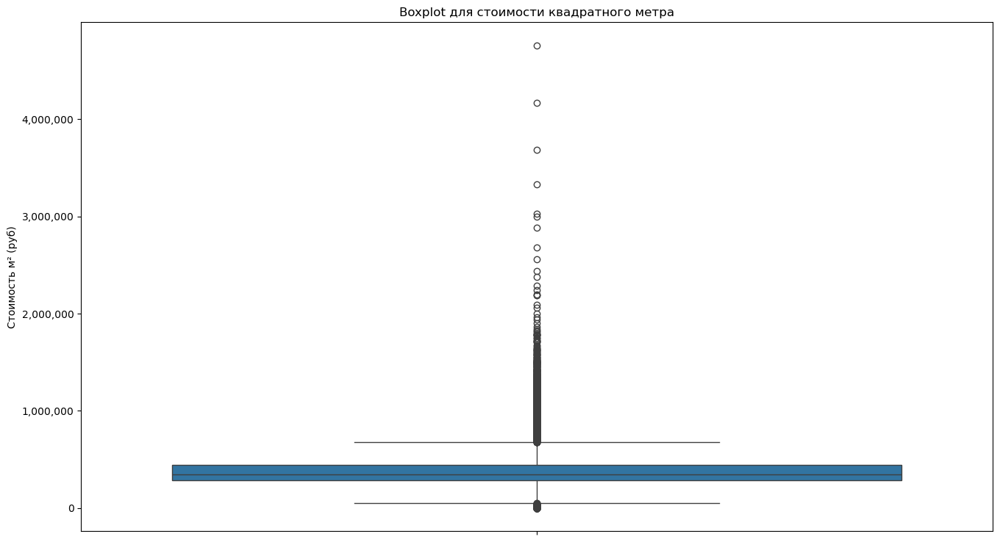

In [70]:
def format_func(value, tick_number):
    return f'{value:,.0f}'

plt.figure(figsize=(16, 9))
sns.boxplot(y=df['Стоимость м² (руб)'])
plt.title('Boxplot для стоимости квадратного метра')
plt.ylabel('Стоимость м² (руб)')
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))
plt.show()

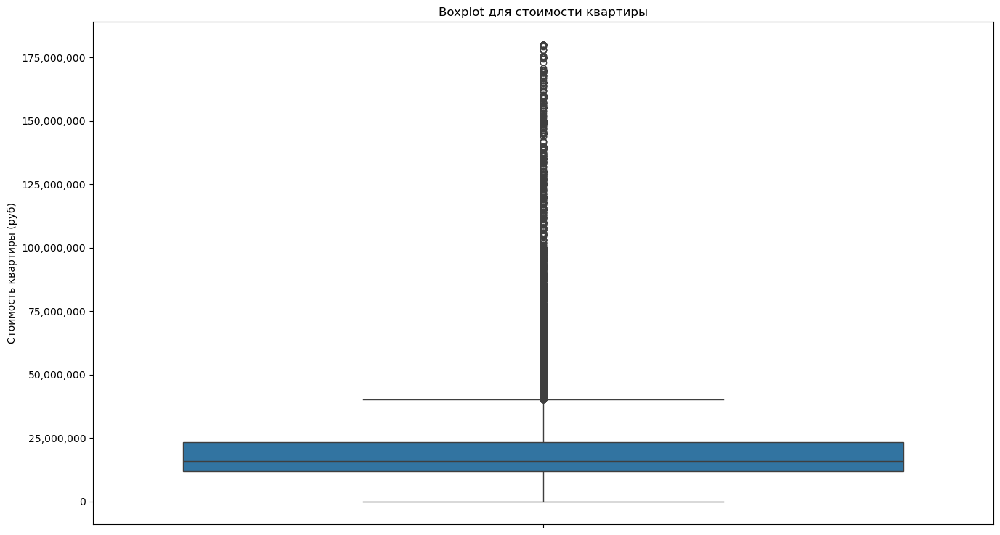

In [71]:
plt.figure(figsize=(16, 9))
sns.boxplot(y=df['Price (rub)'])
plt.title('Boxplot для стоимости квартиры')
plt.ylabel('Стоимость квартиры (руб)')
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_func))
plt.show()

In [72]:
df

,Region,Metro,Adress,House number,Number of Rooms,Square (m2),Living Square (m2),Kitchen Square (m2),Floor,Building Floors,Building Material,Created Date,URL,Title,Land Square (m2),LAT,LNG,Agent,Source,Type,Section,Category,Walk Time to Metro (min),Ceiling Height (m),Renovation,Year Built,Infrastructure,Yard Improvement,Price (rub),Стоимость м² (руб)
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.00,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.00,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37
2,Москва,Беляево,профсоюзная,91,3.00,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.00,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.00,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63650,Москва,Беломорская,NaN,Не указан,3.00,103.00,56.00,9.00,8.00,24.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38
63651,Москва,Тверская,NaN,Не указан,4.00,115.00,100.00,7.00,4.00,7.00,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.20,NaN,NaN,Магазины,Парковка,178000000.00,1547826.09
63652,Москва,Арбатская,NaN,Не указан,2.00,69.70,45.00,15.00,4.00,7.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.00,100.00,40.00,27.00,28.00,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63655 entries, 0 to 63654
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Region                    63655 non-null  object 
 1   Metro                     63655 non-null  object 
 2   Adress                    57671 non-null  object 
 3   House number              63655 non-null  object 
 4   Number of Rooms           62400 non-null  float64
 5   Square (m2)               63655 non-null  float64
 6   Living Square (m2)        63655 non-null  float64
 7   Kitchen Square (m2)       63655 non-null  float64
 8   Floor                     63651 non-null  float64
 9   Building Floors           63651 non-null  float64
 10  Building Material         63655 non-null  object 
 11  Created Date              57681 non-null  object 
 12  URL                       63655 non-null  object 
 13  Title                     63655 non-null  object 
 14  Land S

##Поменяем названия столбиков в вид для питона

In [74]:
df.columns = ['region', 'metro', 'adress', 'house_number', 'number_of_rooms', 'square_m2', 'living_square_m2', 'kitchen_square_m2', 'floor', 'building_floors', 'building_material', 'created_date', 'url', 'title', 'land_square_m2', 'lat', 'lng', 'agent', 'source', 'type', 'section', 'category','walk_to_metro', 'ceiling', 'renovation', 'year_built', 'infrastructure', 'yard_improvement','price_rub', 'price_per_m2_rub']

In [75]:
df

,region,metro,adress,house_number,number_of_rooms,square_m2,living_square_m2,kitchen_square_m2,floor,building_floors,building_material,created_date,url,title,land_square_m2,lat,lng,agent,source,type,section,category,walk_to_metro,ceiling,renovation,year_built,infrastructure,yard_improvement,price_rub,price_per_m2_rub
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.00,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.00,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37
2,Москва,Беляево,профсоюзная,91,3.00,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.00,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.00,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63650,Москва,Беломорская,NaN,Не указан,3.00,103.00,56.00,9.00,8.00,24.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38
63651,Москва,Тверская,NaN,Не указан,4.00,115.00,100.00,7.00,4.00,7.00,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.20,NaN,NaN,Магазины,Парковка,178000000.00,1547826.09
63652,Москва,Арбатская,NaN,Не указан,2.00,69.70,45.00,15.00,4.00,7.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.00,100.00,40.00,27.00,28.00,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60


In [76]:
df_copy = df

In [77]:
df = df.reset_index(drop=True)
df

,region,metro,adress,house_number,number_of_rooms,square_m2,living_square_m2,kitchen_square_m2,floor,building_floors,building_material,created_date,url,title,land_square_m2,lat,lng,agent,source,type,section,category,walk_to_metro,ceiling,renovation,year_built,infrastructure,yard_improvement,price_rub,price_per_m2_rub
0,Москва,Улица Дмитриевского,салтыковская,62к4,2.00,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1.00,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37
2,Москва,Беляево,профсоюзная,91,3.00,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07
3,Москва,Кунцевская,сколковское,40к3,0.00,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2.00,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63650,Москва,Беломорская,NaN,Не указан,3.00,103.00,56.00,9.00,8.00,24.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38
63651,Москва,Тверская,NaN,Не указан,4.00,115.00,100.00,7.00,4.00,7.00,Кирпичный,NaN,https://www.cian.ru/sale/flat/319637340/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,3.20,NaN,NaN,Магазины,Парковка,178000000.00,1547826.09
63652,Москва,Арбатская,NaN,Не указан,2.00,69.70,45.00,15.00,4.00,7.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,NaN,172.00,100.00,40.00,27.00,28.00,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60


##Переведем некоторые колонки в int

In [78]:
columns_to_int = ['number_of_rooms', 'square_m2', 'living_square_m2', 'kitchen_square_m2', 'floor', 'building_floors', 'land_square_m2', 'agent', 'price_rub', 'price_per_m2_rub']
for col in columns_to_int:
    df[col] = pd.to_numeric(df[col], errors='coerce').astype('Int64')

TypeError: cannot safely cast non-equivalent float64 to int64

In [79]:
a = df.groupby('metro')['price_per_m2_rub'].quantile(0.95)
df = df[df['price_per_m2_rub'] <= df['metro'].map(a].copy()

In [80]:
df

,region,metro,adress,house_number,number_of_rooms,square_m2,living_square_m2,kitchen_square_m2,floor,building_floors,building_material,created_date,url,title,land_square_m2,lat,lng,agent,source,type,section,category,walk_to_metro,ceiling,renovation,year_built,infrastructure,yard_improvement,price_rub,price_per_m2_rub
0,Москва,Улица Дмитриевского,салтыковская,62к4,2,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24T22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94
1,Москва,Народное Ополчение,демьяна бедного,2к4,1,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19T14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37
2,Москва,Беляево,профсоюзная,91,3,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01T10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07
3,Москва,Кунцевская,сколковское,40к3,0,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02T04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58
4,Москва,Водный стадион,кронштадтский,6к3,2,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05T00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63649,Москва,Волоколамская,NaN,Не указан,1,52.40,18.70,23.40,7.00,22.00,Панельный,NaN,https://www.cian.ru/sale/flat/313296332/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8 мин,3.37,NaN,2024.00,Школы,"Парковка, Видеонаблюдение",32500000.00,620229.01
63650,Москва,Беломорская,NaN,Не указан,3,103.00,56.00,9.00,8.00,24.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38
63652,Москва,Арбатская,NaN,Не указан,2,69.70,45.00,15.00,4.00,7.00,Монолитный,NaN,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16
63653,Москва,Мичуринский проспект,NaN,Не указан,<NA>,172.00,100.00,40.00,27.00,28.00,Панельный,NaN,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60


##Добавим столбики по дате, времени и дню недели загрузки объявления

In [81]:
df['created_date'] = pd.to_datetime(df['created_date'])
df['created_date_only'] = df['created_date'].dt.date
df['created_hour'] = df['created_date'].dt.hour
df['created_day_of_week'] = df['created_date'].dt.day_name()

In [82]:
df

,region,metro,adress,house_number,number_of_rooms,square_m2,living_square_m2,kitchen_square_m2,floor,building_floors,building_material,created_date,url,title,land_square_m2,lat,lng,agent,source,type,section,category,walk_to_metro,ceiling,renovation,year_built,infrastructure,yard_improvement,price_rub,price_per_m2_rub,created_date_only,created_hour,created_day_of_week
0,Москва,Улица Дмитриевского,салтыковская,62к4,2,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24 22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94,2024-05-24,22.00,Friday
1,Москва,Народное Ополчение,демьяна бедного,2к4,1,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19 14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37,2024-10-19,14.00,Saturday
2,Москва,Беляево,профсоюзная,91,3,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01 10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07,2024-11-01,10.00,Friday
3,Москва,Кунцевская,сколковское,40к3,0,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02 04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58,2024-11-02,4.00,Saturday
4,Москва,Водный стадион,кронштадтский,6к3,2,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05 00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16,2024-11-05,0.00,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63649,Москва,Волоколамская,NaN,Не указан,1,52.40,18.70,23.40,7.00,22.00,Панельный,NaT,https://www.cian.ru/sale/flat/313296332/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8 мин,3.37,NaN,2024.00,Школы,"Парковка, Видеонаблюдение",32500000.00,620229.01,NaT,NaN,NaN
63650,Москва,Беломорская,NaN,Не указан,3,103.00,56.00,9.00,8.00,24.00,Монолитный,NaT,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38,NaT,NaN,NaN
63652,Москва,Арбатская,NaN,Не указан,2,69.70,45.00,15.00,4.00,7.00,Монолитный,NaT,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16,NaT,NaN,NaN
63653,Москва,Мичуринский проспект,NaN,Не указан,<NA>,172.00,100.00,40.00,27.00,28.00,Панельный,NaT,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60,NaT,NaN,NaN


In [83]:
df

,region,metro,adress,house_number,number_of_rooms,square_m2,living_square_m2,kitchen_square_m2,floor,building_floors,building_material,created_date,url,title,land_square_m2,lat,lng,agent,source,type,section,category,walk_to_metro,ceiling,renovation,year_built,infrastructure,yard_improvement,price_rub,price_per_m2_rub,created_date_only,created_hour,created_day_of_week
0,Москва,Улица Дмитриевского,салтыковская,62к4,2,53.80,22.30,19.00,6.00,12.00,монолитный,2024-05-24 22:08:03+03:00,https://www.avito.ru/moskva/kvartiry/2-k._kvar...,"2-к. квартира, 53,8 м², 6/12 эт.",0.00,55.73,37.86,0.00,avito.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,12980000.00,241263.94,2024-05-24,22.00,Friday
1,Москва,Народное Ополчение,демьяна бедного,2к4,1,38.00,22.80,7.22,10.00,17.00,Панельный,2024-10-19 14:29:02+03:00,https://domclick.ru/card/sale__flat__2061781795,Не указано,0.00,55.77,37.49,0.00,domclick.ru,Продам,Жилая недвижимость,1-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,15350000.00,403947.37,2024-10-19,14.00,Saturday
2,Москва,Беляево,профсоюзная,91,3,100.50,58.40,12.50,14.00,23.00,Монолитный,2024-11-01 10:04:04+03:00,https://www.cian.ru/sale/flat/309362629,"3-к кв. Москва Профсоюзная ул., 91 (100.5 м²)",0.00,55.64,37.53,0.00,cian.ru,Продам,Жилая недвижимость,3-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,40500000.00,402985.07,2024-11-01,10.00,Friday
3,Москва,Кунцевская,сколковское,40к3,0,31.00,18.00,10.00,2.00,15.00,Монолитный,2024-11-02 04:04:02+03:00,https://www.cian.ru/sale/flat/309415896,Свободной планировки кв. Москва Сколковское ш....,0.00,55.70,37.39,0.00,cian.ru,Продам,Жилая недвижимость,Студия,NaN,NaN,NaN,NaN,NaN,NaN,12999000.00,419322.58,2024-11-02,4.00,Saturday
4,Москва,Водный стадион,кронштадтский,6к3,2,43.00,30.00,12.00,5.00,22.00,Монолитно-кирпичный,2024-11-05 00:04:03+03:00,https://www.cian.ru/sale/flat/309501157,"2-к кв. Москва Кронштадтский бул., 6к3 (43.0 м²)",0.00,55.84,37.50,0.00,cian.ru,Продам,Жилая недвижимость,2-к квартира,NaN,NaN,NaN,NaN,NaN,NaN,17400000.00,404651.16,2024-11-05,0.00,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63649,Москва,Волоколамская,NaN,Не указан,1,52.40,18.70,23.40,7.00,22.00,Панельный,NaT,https://www.cian.ru/sale/flat/313296332/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8 мин,3.37,NaN,2024.00,Школы,"Парковка, Видеонаблюдение",32500000.00,620229.01,NaT,NaN,NaN
63650,Москва,Беломорская,NaN,Не указан,3,103.00,56.00,9.00,8.00,24.00,Монолитный,NaT,https://www.cian.ru/sale/flat/319396672/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4 мин,3.10,NaN,2016.00,"Торговые центры, Школы, Магазины","Парковка, Охрана, Видеонаблюдение",35750000.00,347087.38,NaT,NaN,NaN
63652,Москва,Арбатская,NaN,Не указан,2,69.70,45.00,15.00,4.00,7.00,Монолитный,NaT,https://www.cian.ru/sale/flat/319642874/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6 мин,NaN,NaN,2017.00,"Школы, Магазины","Парковка, Видеонаблюдение",88961258.00,1276345.16,NaT,NaN,NaN
63653,Москва,Мичуринский проспект,NaN,Не указан,<NA>,172.00,100.00,40.00,27.00,28.00,Панельный,NaT,https://www.cian.ru/sale/flat/319585927/,Не указано,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18 мин,NaN,NaN,2025.00,"Школы, Магазины",Парковка,116000000.00,674418.60,NaT,NaN,NaN


In [84]:
stations = ['Деловой центр', 'Деловой центр (МЦК)', 'Международная', 'Выставочная', 'Москва-Сити']
for station in stations:
    if station in df['metro'].values:
        df['metro'] = df['metro'].replace(station, 'Москва-Сити')

In [85]:
df['year_month'] = df['created_date'].dt.strftime('%Y-%m')

In [86]:
for col in df.select_dtypes(include=['datetimetz']).columns:
    df[col] = df[col].dt.tz_localize(None)

In [87]:
extra = pd.read_csv('parsed_alllinks.csv')

df = df.merge(
    extra[['walk_time', 'infrastructure', 'yard_improvement']], 
    how='left', 
    left_index=True, 
    right_index=True
)

df['walk_time'] = df['walk_time'].str.extract('(\d+)')

In [88]:
def categorize_floor(row):
    floor = row['floor']
    total_floors = row['building_floors']
    
    if floor == 1:
        return 'Первый'
    elif floor == total_floors:
        return 'Последний'
    elif 1 < floor < total_floors:
        return 'Средние этажи'

df['floor_category'] = df.apply(categorize_floor, axis=1)

# Выведем топ 5 самых популярных и менее популярных метро

In [89]:
df_filtered = df[df['created_date'] >= '2024-10-01']

metro_counts = df_filtered['metro'].value_counts().reset_index()
metro_counts.columns = ['metro', 'count']

metro_counts = metro_counts[metro_counts['count'] < 600]

top_5 = metro_counts.head(5)
bottom_5 = metro_counts.tail(5)

top_bottom_10 = pd.concat([top_5, bottom_5])

top_bottom_10['color_category'] = top_bottom_10['metro'].isin(top_5['metro']).map({True: 'Частые продажи',False: 'Редкие продажи'})

fig = px.bar(top_bottom_10, 
             x='count', 
             y='metro',
             orientation='h',
             color='color_category',
             color_discrete_map={'Частые продажи': 'green', 'Редкие продажи': 'red'},
             title='5 станций с самыми частыми и 5 с самыми редкими продажами<br>(с 2024-10-01, <600 объявлений)',
             text='count')

fig.update_traces(texttemplate='%{text} объявлений', textposition='outside')

fig.update_layout(
    yaxis={'categoryorder':'total ascending'},
    xaxis_title="Количество объявлений",
    yaxis_title="Станция метро",
    height=600
)

fig.show()

# Познакомимся с инфраструктурой

In [90]:
df_infra = df[df['infrastructure_y'].notna()].copy()

infrastructure_items = []

for infrastructure_str in df_infra['infrastructure_y'].dropna():
    items = [item.strip() for item in infrastructure_str.split(',')]
    infrastructure_items.extend(items)

infra_counts_total = pd.Series(infrastructure_items).value_counts().reset_index()
infra_counts_total.columns = ['infrastructure', 'total_count']

metro_infra_rows = []

for idx, row in df_infra.iterrows():
    metro = row['metro']
    infrastructure_str = row['infrastructure_y']
    
    if pd.notna(infrastructure_str):
        items = [item.strip() for item in infrastructure_str.split(',')]
        for item in items:
            metro_infra_rows.append({'metro': metro, 'infrastructure': item })

metro_infra_df = pd.DataFrame(metro_infra_rows)

metro_infra_counts = metro_infra_df.groupby(['metro', 'infrastructure']).size().reset_index(name='count')

top_metros = metro_infra_df['metro'].value_counts().head(10).index

top_metro_infra = metro_infra_counts[metro_infra_counts['metro'].isin(top_metros)]

fig = px.density_heatmap(
    top_metro_infra,
    x='infrastructure',
    y='metro',
    z='count',
    title='Распределение элементов инфраструктуры по станциям метро',
    color_continuous_scale='Blues'
)

fig.update_layout(
    xaxis_title="Элемент инфраструктуры",
    yaxis_title="Станция метро",
    height=600
)

fig.show()

top_infra_items = infra_counts_total.head(10)

fig2 = px.bar(
    top_infra_items,
    x='infrastructure',
    y='total_count',
    title='Топ-10 самых частых элементов инфраструктуры',
    color_discrete_sequence=['blue']
)

fig2.update_layout(
    xaxis_title="Элемент инфраструктуры",
    yaxis_title="Количество упоминаний",
    height = 600
)

fig2.show()

# Площадь квартир по станции метро

In [91]:
metro_stats = df.groupby('metro').agg({'square_m2': 'mean','lat': 'count'}).rename(columns={'lat': 'count'}).reset_index()

metro_stats = metro_stats[metro_stats['count'] > 25]

metro_stats_sorted = metro_stats.sort_values('square_m2')
smallest_5 = metro_stats_sorted.head(5)
largest_5 = metro_stats_sorted.tail(5)

top_bottom_10 = pd.concat([smallest_5, largest_5])

top_bottom_10['color_category'] = top_bottom_10['metro'].isin(smallest_5['metro']).map({True: 'Маленькие квартиры',False: 'Крупные квартиры'})

fig = px.bar(top_bottom_10, 
             x='square_m2', 
             y='metro',
             orientation='h',
             color='color_category',
             color_discrete_map={'Маленькие квартиры': 'red', 'Крупные квартиры': 'green'},
             title='5 станций с самыми маленькими и 5 с самыми крупными квартирами<br>(более 25 объявлений)',
             hover_data={'count': True},
             text='square_m2')

fig.update_traces(texttemplate='%{text:.1f} м²', textposition='outside')

fig.update_layout(
    xaxis_title="Средняя площадь квартиры, м²",
    yaxis_title="Станция метро",
    height=600
)

fig.show()

# Динамика средней площади по году строительства

In [104]:
df_with_year = df[df['year_built'].notna()]
df_with_year = df_with_year[(df_with_year['year_built'] >= 2003) & (df_with_year['year_built'] < 2026)]

year_counts = df_with_year['year_built'].value_counts()
years_with_enough_data = year_counts[year_counts > 25].index

df_filtered = df_with_year[df_with_year['year_built'].isin(years_with_enough_data)]

year_stats = df_filtered.groupby('year_built')['square_m2'].mean().reset_index()
year_stats = year_stats.rename(columns={'square_m2': 'avg_square_m2'})

fig = px.line(year_stats, x='year_built', y='avg_square_m2', title='Средняя площадь квартир по году постройки дома')

fig.update_layout(
    xaxis_title='Год постройки дома',
    yaxis_title='Средняя площадь, м²',
    yaxis_range=[0, year_stats['avg_square_m2'].max() * 1.1],
    height=600
)
fig.show()

# Корреляция цены и площади

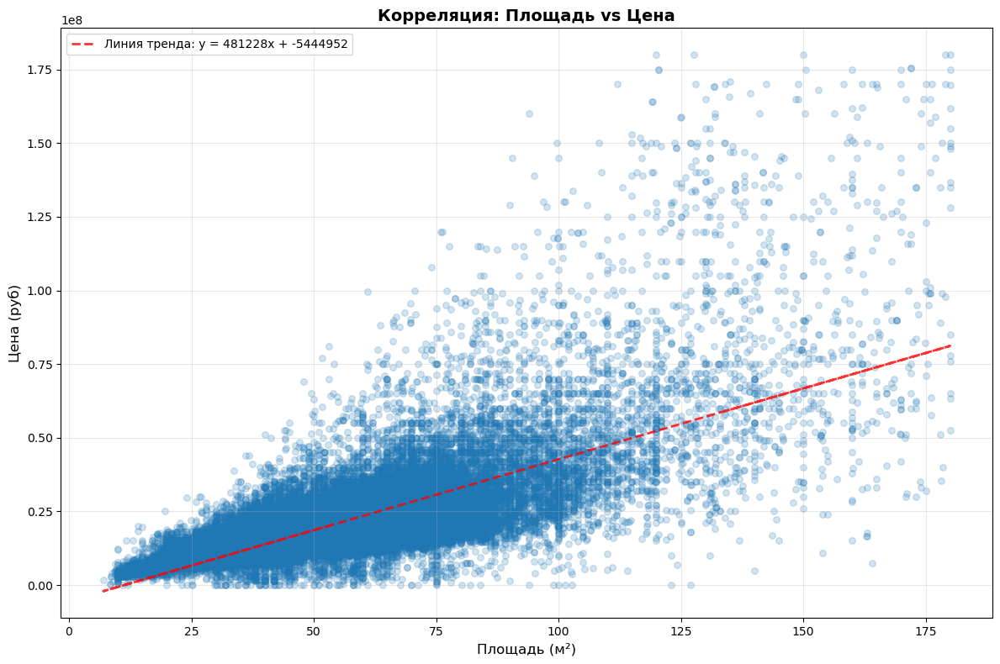

Коэффициент корреляции: 0.737


In [93]:
plt.figure(figsize=(12, 8))
plt.scatter(df['square_m2'], df['price_rub'], alpha=0.2, s=30)
plt.xlabel('Площадь (м²)', fontsize=12)
plt.ylabel('Цена (руб)', fontsize=12)
plt.title('Корреляция: Площадь vs Цена', fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)

z = np.polyfit(df['square_m2'], df['price_rub'], 1) 
p = np.poly1d(z)
plt.plot(df['square_m2'], p(df['square_m2']), "r--", linewidth=2, alpha=0.8, label=f'Линия тренда: y = {z[0]:.0f}x + {z[1]:.0f}')

plt.legend()
plt.tight_layout()
plt.show()

correlation = df['square_m2'].corr(df['price_rub'])  
print(f"Коэффициент корреляции: {correlation:.3f}")

# Средняя цена в зависимости от этажа

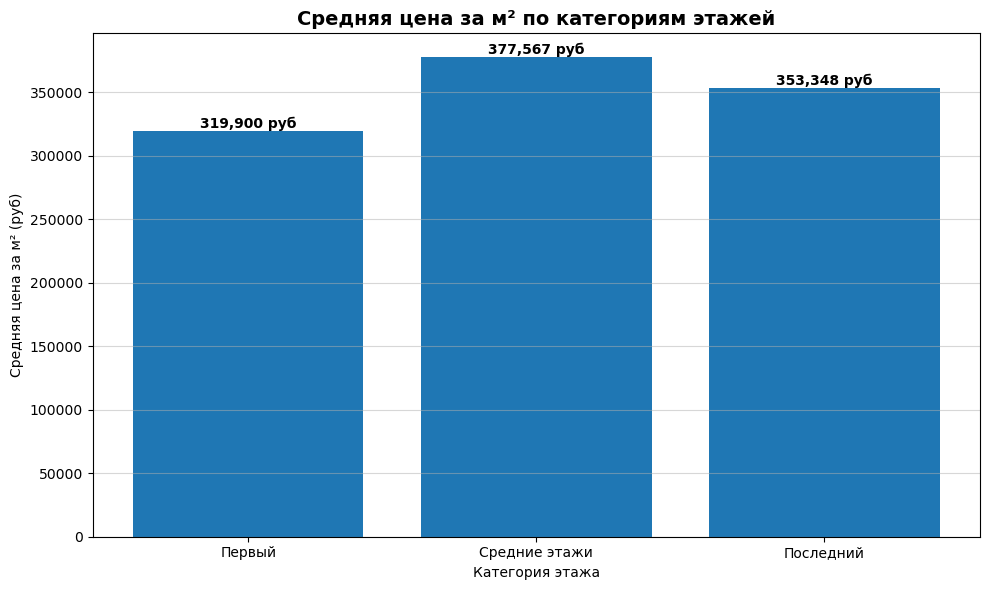

In [94]:
correct_order = ['Первый', 'Средние этажи', 'Последний']

price_by_floor = df.groupby('floor_category')['price_per_m2_rub'].mean()
price_by_floor = price_by_floor.reindex(correct_order)


plt.figure(figsize=(10, 6))
bars = plt.bar(price_by_floor.index, price_by_floor.values)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:,.0f} руб',
             ha='center', va='bottom', fontweight='bold')

plt.title('Средняя цена за м² по категориям этажей', fontsize=14, fontweight='bold')
plt.xlabel('Категория этажа')
plt.ylabel('Средняя цена за м² (руб)')
plt.grid(axis='y', alpha=0.5)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Топ 5 дешевых и дорогих станций метро по стоимости квартиры

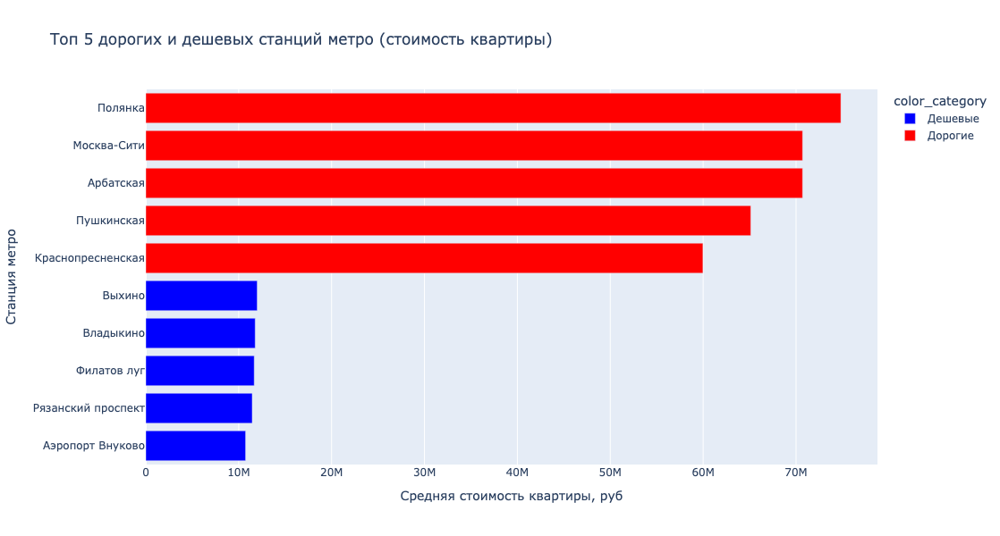

In [95]:
metro_stats = df.groupby('metro').agg({'price_rub': 'mean', 'lat': 'count'}).rename(columns={'lat': 'count'}).reset_index()

metro_stats = metro_stats[metro_stats['count'] > 25]

metro_stats_sorted = metro_stats.sort_values('price_rub')
cheapest_5 = metro_stats_sorted.head(5)
expensive_5 = metro_stats_sorted.tail(5)

top_bottom_10 = pd.concat([cheapest_5, expensive_5])

top_bottom_10['color_category'] = top_bottom_10['metro'].isin(cheapest_5['metro']).map({  # исправлено с 'Metro'
    True: 'Дешевые',
    False: 'Дорогие'
})

fig = px.bar(top_bottom_10, 
             x='price_rub', 
             y='metro',  
             orientation='h',
             color='color_category',
             color_discrete_map={'Дешевые': 'blue', 'Дорогие': 'red'},
             title='Топ 5 дорогих и дешевых станций метро (стоимость квартиры)',
             hover_data={'count': True})

fig.update_layout(
    xaxis_title="Средняя стоимость квартиры, руб",
    yaxis_title="Станция метро",
    height = 600
)


fig.show()

# Топ 5 дорогих и дешевых метро по м2

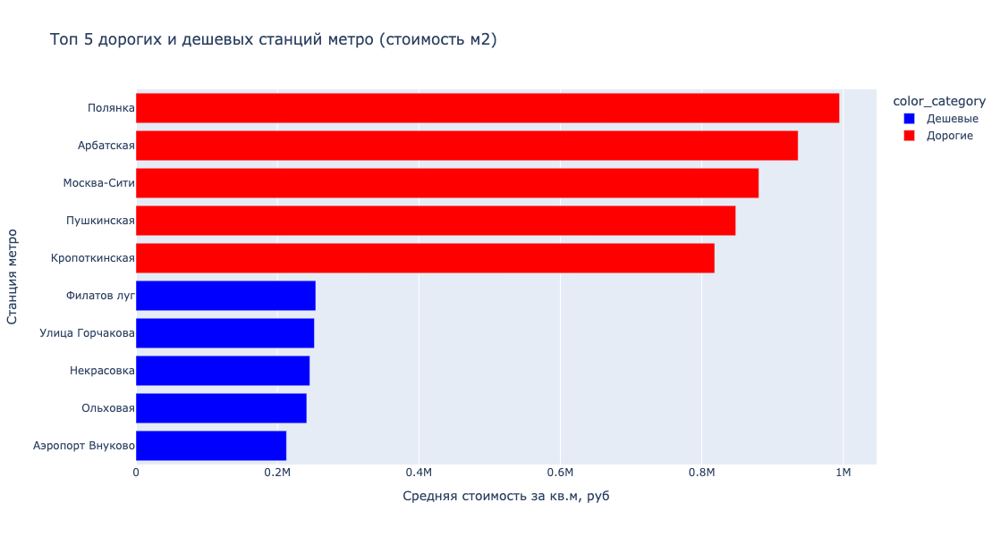

In [96]:
metro_stats = df.groupby('metro').agg({'square_m2': 'sum', 'price_rub': 'sum',  'lat': 'count'  }).rename(columns={'lat': 'count'}).reset_index()

metro_stats = metro_stats[metro_stats['count'] > 25]

metro_stats['avg_price_per_m2'] = metro_stats['price_rub'] / metro_stats['square_m2'] 

metro_stats_sorted = metro_stats.sort_values('avg_price_per_m2')
cheapest_5 = metro_stats_sorted.head(5)
expensive_5 = metro_stats_sorted.tail(5)

top_bottom_10 = pd.concat([cheapest_5, expensive_5])

top_bottom_10['color_category'] = top_bottom_10['metro'].isin(cheapest_5['metro']).map({True: 'Дешевые', False: 'Дорогие'})


fig = px.bar(top_bottom_10, 
             x='avg_price_per_m2', 
             y='metro',  
             orientation='h',
             color='color_category',
             color_discrete_map={'Дешевые': 'blue', 'Дорогие': 'red'},
             title='Топ 5 дорогих и дешевых станций метро (стоимость м2)',
             hover_data={'count': True, 'square_m2': ':.0f'}) 

fig.update_layout(
    xaxis_title="Средняя стоимость за кв.м, руб",
    yaxis_title="Станция метро",
    height=600
)

fig.show()

# Динамика стоимости м2

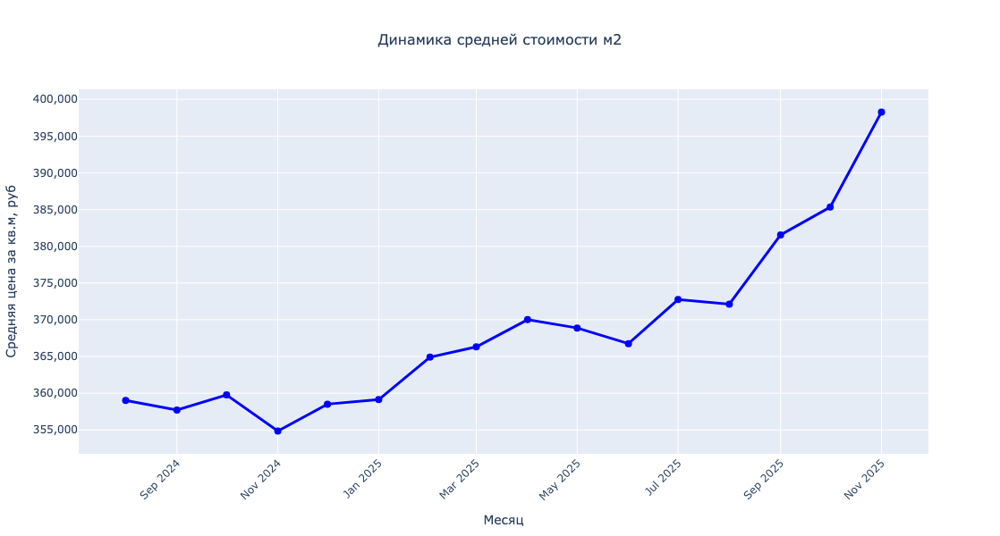

In [97]:
df['year_month'] = df['created_date'].dt.to_period('M').dt.to_timestamp()

monthly_stats = (
    df[df['created_date'].dt.year.isin([2024, 2025])].groupby('year_month').agg({'price_per_m2_rub': 'mean',  'lat': 'count'})
    .rename(columns={'lat': 'count', 'price_per_m2_rub': 'avg_price_per_m2'})
    .query('count > 500')
    .reset_index()
)

monthly_stats['year_month_str'] = monthly_stats['year_month'].dt.strftime('%Y-%m')


fig = go.Figure()

fig.add_trace(go.Scatter(
    x=monthly_stats['year_month'],
    y=monthly_stats['avg_price_per_m2'],
    mode='lines+markers',
    line=dict(color='blue', width=3),
    marker=dict(size=8, color='blue'),
    hovertemplate=(
        '<b>%{x|%B %Y}</b><br>'
        'Цена: %{y:,.0f} руб/м²<br>'
        'Объявлений: %{customdata}<br>'
    ),
    customdata=monthly_stats['count']
))

fig.update_layout(
    title=dict(
        text='Динамика средней стоимости м2',
        x=0.5,
        xanchor='center',
        font=dict(size=16)
    ),
    xaxis=dict(
        title='Месяц',
        tickformat='%b %Y',
        tickangle=-45
    ),
    yaxis=dict(
        title='Средняя цена за кв.м, руб',
        tickformat=','
    ),
    height=600
)

fig.show()

# Динамика стоимости м2 в зависимости от комнат

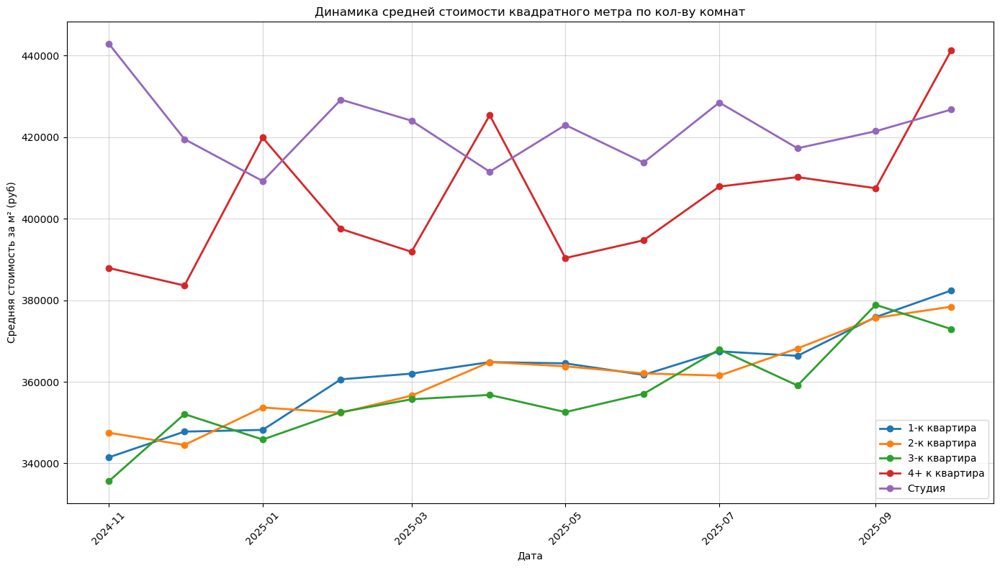

In [98]:
df_filtered = df[(df['created_date'] >= '2024-11-01') & (df['created_date'] < '2025-11-01')]

monthly_avg = df_filtered.groupby(['year_month', 'category'])['price_per_m2_rub'].mean().reset_index()

plt.figure(figsize=(14, 8))

for category in monthly_avg['category'].unique():
    category_data = monthly_avg[monthly_avg['category'] == category]
    plt.plot(category_data['year_month'], category_data['price_per_m2_rub'], 
             marker='o', linewidth=2, label=category)

plt.title('Динамика средней стоимости квадратного метра по кол-ву комнат')
plt.xlabel('Дата')
plt.ylabel('Средняя стоимость за м² (руб)')
plt.legend()
plt.grid(alpha=0.5)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 60329 entries, 0 to 63654
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   region               60329 non-null  object        
 1   metro                60329 non-null  object        
 2   adress               54802 non-null  object        
 3   house_number         60329 non-null  object        
 4   number_of_rooms      59208 non-null  Int64         
 5   square_m2            60329 non-null  float64       
 6   living_square_m2     60329 non-null  float64       
 7   kitchen_square_m2    60329 non-null  float64       
 8   floor                60325 non-null  float64       
 9   building_floors      60325 non-null  float64       
 10  building_material    60329 non-null  object        
 11  created_date         54810 non-null  datetime64[ns]
 12  url                  60329 non-null  object        
 13  title                60329 non-null 

# Динамика по метро

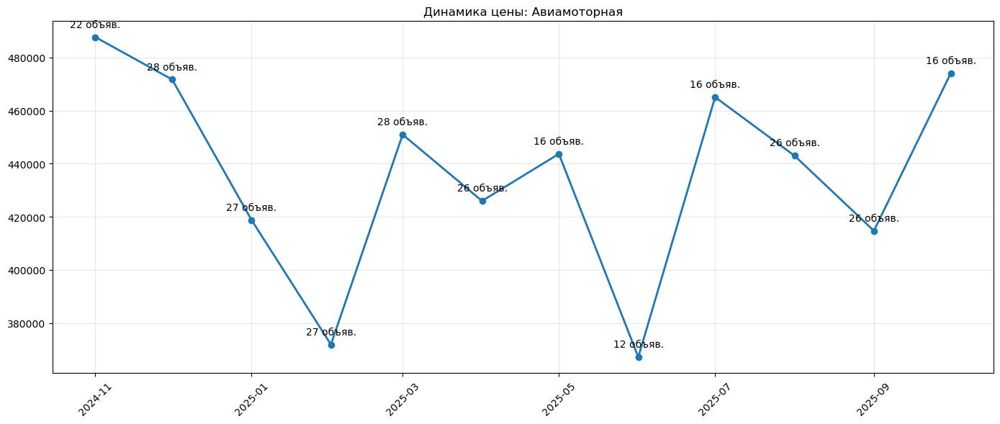

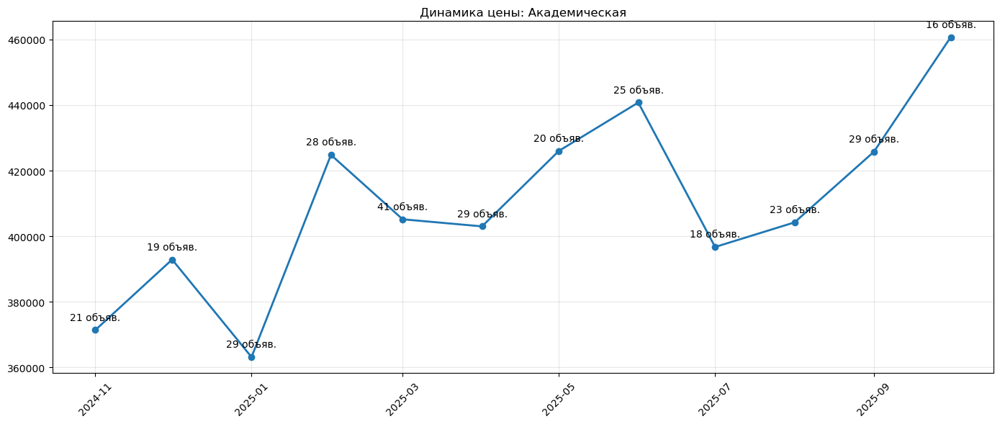

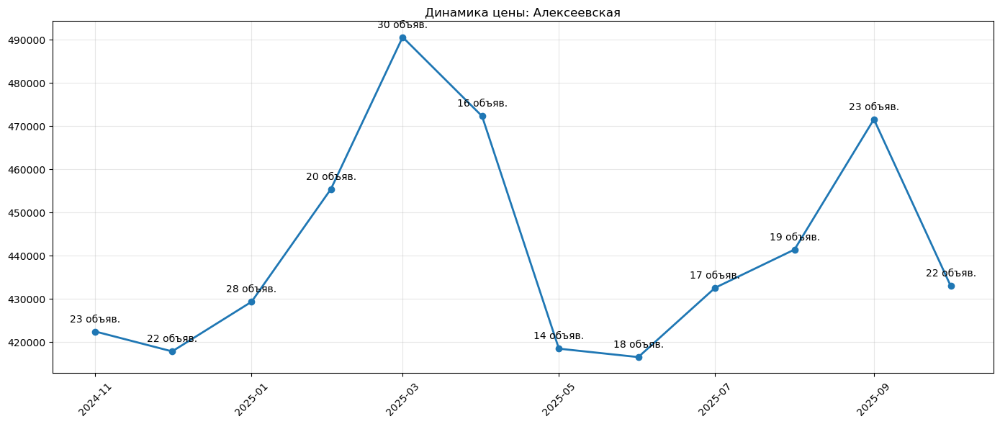

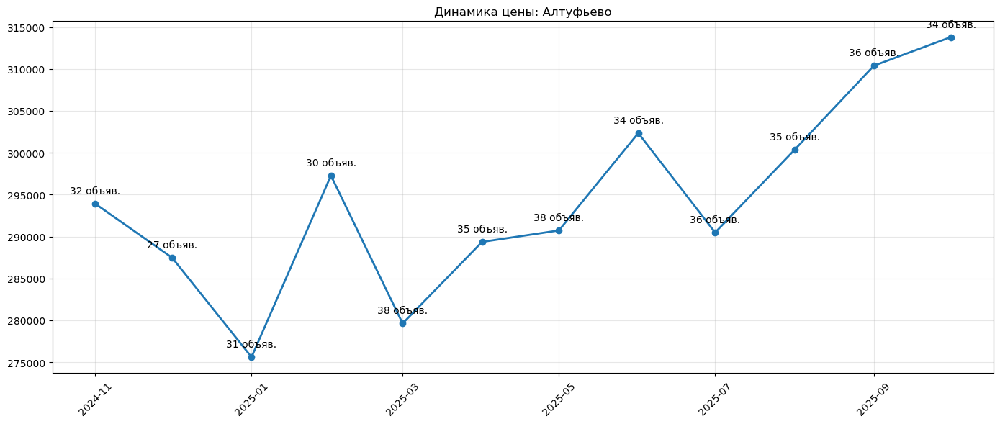

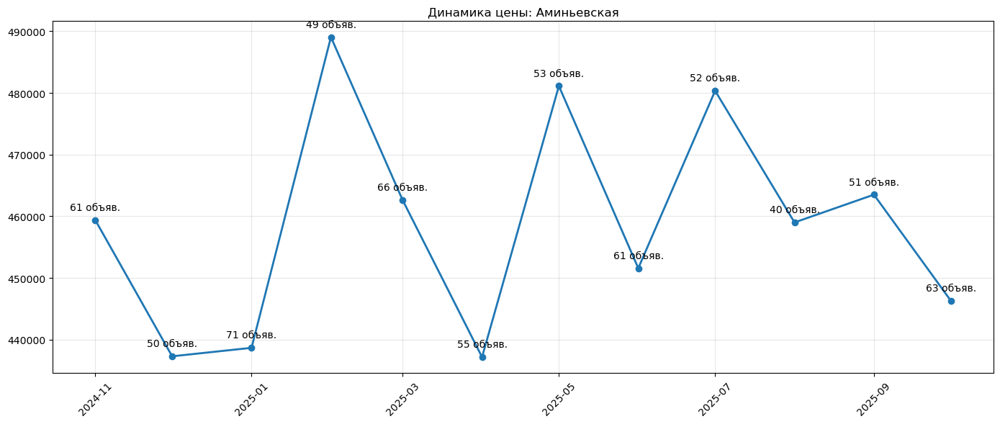

...

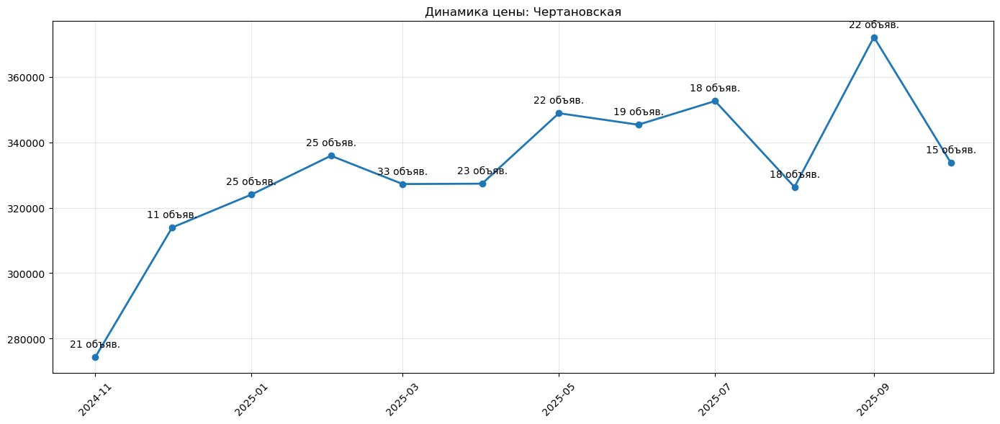

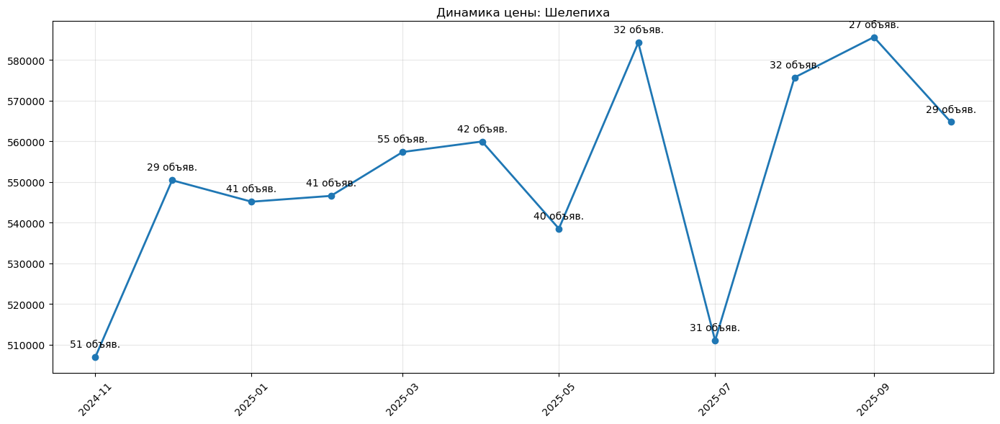

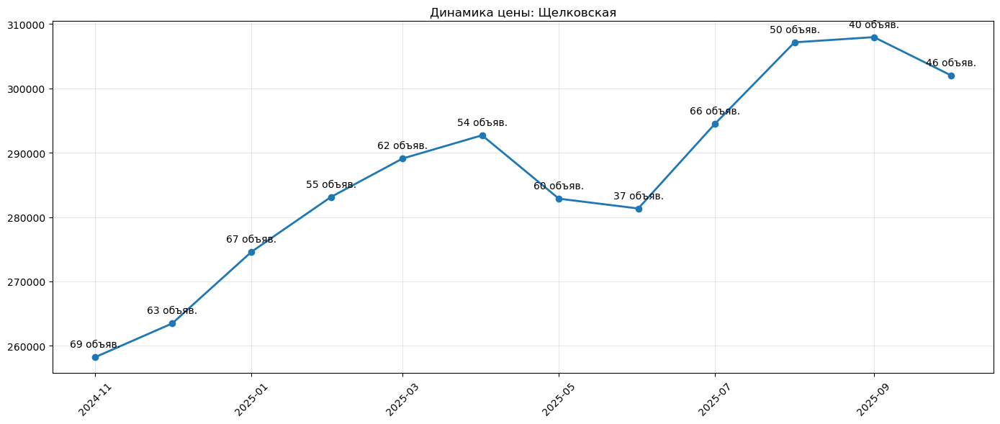

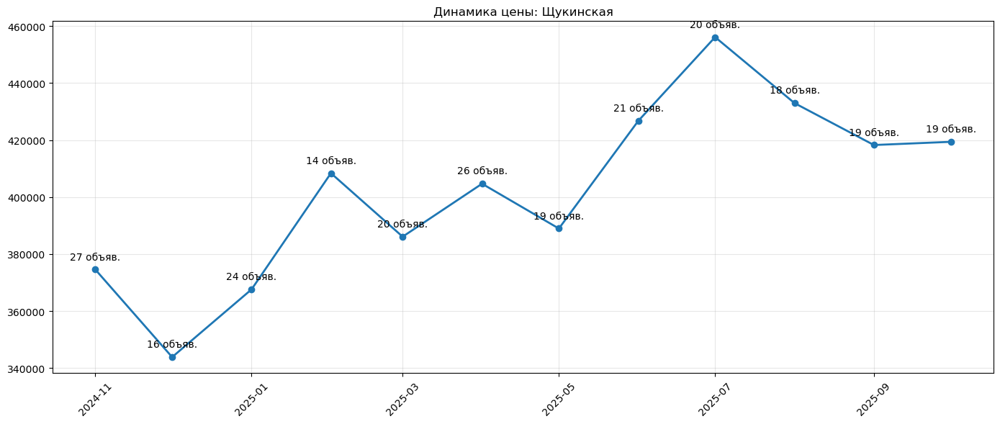

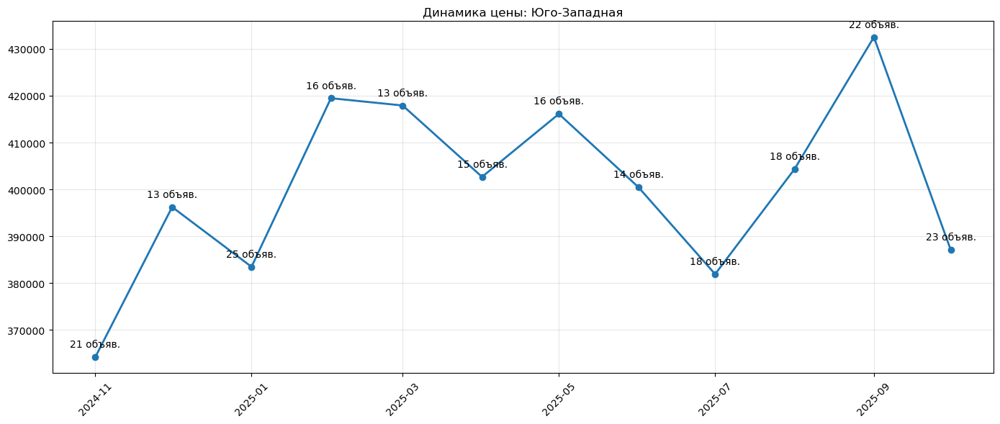

In [100]:
df_filtered = df[(df['year_month'] >= '2024-11-01') & (df['year_month'] < '2025-11-01')]

monthly_stats = df_filtered.groupby(['metro', 'year_month']).agg({
    'price_per_m2_rub': 'mean',
    'url': 'count'
}).rename(columns={'price_per_m2_rub': 'mean_price', 'url': 'count'}).reset_index()

valid_stations = monthly_stats.groupby('metro').filter(lambda x: x[x['year_month'] != '2025-11-01']['count'].min() > 10)['metro'].unique()

monthly_stats = monthly_stats[monthly_stats['metro'].isin(valid_stations)]
pivot_df = monthly_stats.pivot(index='year_month', columns='metro', values='mean_price')

for station in valid_stations:
    station_data = pivot_df[station].dropna()
    counts = monthly_stats[monthly_stats['metro'] == station].set_index('year_month')['count']
    
    plt.figure(figsize=(14, 6))
    plt.plot(station_data.index, station_data.values, marker='o', linewidth=2)
    
    for date, price in zip(station_data.index, station_data.values):
        plt.annotate(f"{counts[date]} объяв.", (date, price), xytext=(0, 10), textcoords='offset points', ha='center')
    
    plt.title(f'Динамика цены: {station}')
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Изменение стоимости м2

In [101]:
df['created_date'] = pd.to_datetime(df['created_date'])

nov_2024 = df[(df['created_date'] >= '2024-11-01') & (df['created_date'] <= '2024-11-30')]
nov_2025 = df[(df['created_date'] >= '2025-11-01') & (df['created_date'] <= '2025-11-30')]

avg_price_nov_2024 = nov_2024['price_per_m2_rub'].mean()
avg_price_nov_2025 = nov_2025['price_per_m2_rub'].mean()

absolute_change = avg_price_nov_2025 - avg_price_nov_2024
relative_change = (absolute_change / avg_price_nov_2024) * 100

print(f"2024: {avg_price_nov_2024:,.0f} руб")
print(f"2025: {avg_price_nov_2025:,.0f} руб")
print(f"Абсолют: {absolute_change:+,.0f} руб")
print(f"Относ: {relative_change:+.1f}%")

2024: 354,700 руб
2025: 398,278 руб
Абсолют: +43,578 руб
Относ: +12.3%


# Станции метро по изменению м2

In [102]:
oct_2024_data = df[(df['created_date'] >= '2024-10-01') & (df['created_date'] <= '2024-10-31')]
oct_2025_data = df[(df['created_date'] >= '2025-10-01') & (df['created_date'] <= '2025-10-31')]

results = []
for metro in df['metro'].unique():
    metro_2024 = oct_2024_data[oct_2024_data['metro'] == metro]
    metro_2025 = oct_2025_data[oct_2025_data['metro'] == metro]
    
    if len(metro_2024) >= 5 and len(metro_2025) >= 10:
        avg_2024 = metro_2024['price_per_m2_rub'].mean()
        avg_2025 = metro_2025['price_per_m2_rub'].mean()
        
        change_percent = ((avg_2025 - avg_2024) / avg_2024) * 100
        results.append({
            'metro': metro,
            'change': round(change_percent, 1)
        })

result_df = pd.DataFrame(results).sort_values('change', ascending=False)

result_df

,metro,change
67,Автозаводская,33.10
65,Волгоградский проспект,27.10
45,Марьино,24.70
52,Кожуховская,23.50
29,Отрадное,20.30
...,...,...
28,Варшавская,-11.20
46,Коптево,-15.10
37,Строгино,-17.30
33,Октябрьское поле,-17.60


# карта

In [103]:
lat_min, lat_max = df['lat'].min(), df['lat'].max()
lng_min, lng_max = df['lng'].min(), df['lng'].max()
avg_lat = (lat_min + lat_max) / 2
lat_cell_size = 1 / 111.0
lng_cell_size = 1 / (111.0 * np.cos(np.radians(avg_lat)))

polygons = []
for i in range(int((lat_max - lat_min) / lat_cell_size)):
    for j in range(int((lng_max - lng_min) / lng_cell_size)):
        lat1 = lat_min + i * lat_cell_size
        lat2 = lat1 + lat_cell_size
        lng1 = lng_min + j * lng_cell_size
        lng2 = lng1 + lng_cell_size
        polygon = [[lng1, lat1], [lng2, lat1], [lng2, lat2], [lng1, lat2], [lng1, lat1]]
        polygons.append({
            'type': 'Feature',
            'geometry': {'type': 'Polygon', 'coordinates': [polygon]},
            'properties': {'id': f'grid_{i}_{j}'}
        })

grid_geojson = {'type': 'FeatureCollection', 'features': polygons}

def assign_to_grid(row):
    for feature in grid_geojson['features']:
        coords = feature['geometry']['coordinates'][0]
        lngs = [coord[0] for coord in coords]
        lats = [coord[1] for coord in coords]
        if (min(lats) <= row['lat'] <= max(lats) and min(lngs) <= row['lng'] <= max(lngs)):
            return feature['properties']['id']
    return None

df['grid_id'] = df.apply(assign_to_grid, axis=1)

grid_prices = df[df['grid_id'].notna()].groupby('grid_id').agg({
    'price_per_m2_rub': 'mean'
}).reset_index()

fig = px.choropleth_mapbox(
    grid_prices,
    geojson=grid_geojson,
    locations='grid_id',
    color='price_per_m2_rub',
    featureidkey="properties.id",
    color_continuous_scale="RdYlBu_r",
    mapbox_style="open-street-map",
    zoom=10,
    center={"lat": df['lat'].mean(), "lon": df['lng'].mean()},
    opacity=0.7,
    height=800,
    width=1200
)

fig.update_layout(
    coloraxis_colorbar=dict(
        title='Стоимость м², руб'
    )
)

fig.show()